[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Total number of articles: 7617

Articles by year:
clean_year
2005.0       1
2009.0       2
2010.0       1
2011.0       1
2014.0       1
2015.0       1
2016.0      77
2017.0     471
2018.0     337
2019.0     638
2020.0    1190
2021.0    2540
2022.0    2216
Name: count, dtype: int64

Articles by crime category:
crime_category
Other              4406
Violent Crime      1859
Arrests             574
Financial Crime     304
Property Crime      234
Drug Crime          149
Cyber Crime          91
Name: count, dtype: int64

Top 10 news sources:
source
timesofindia.indiatimes.com    7381
m.timesofindia.com              236
Name: count, dtype: int64


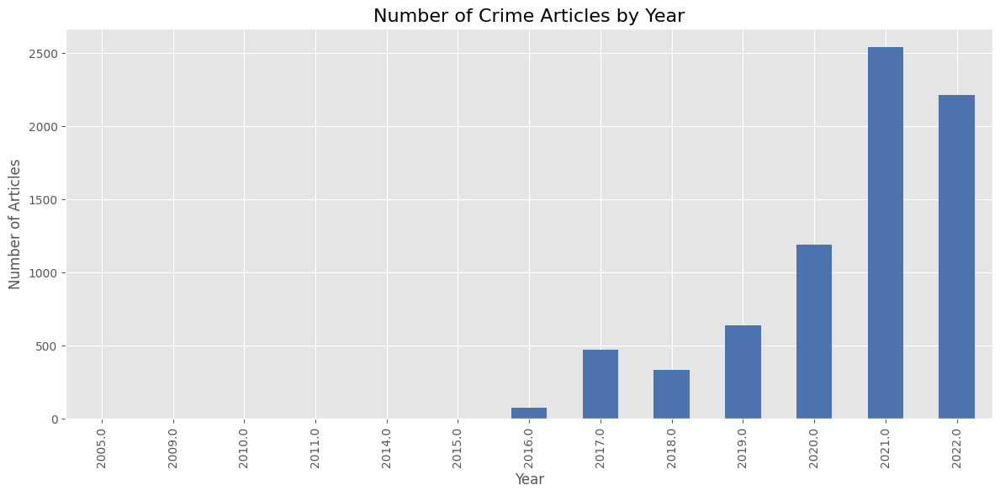

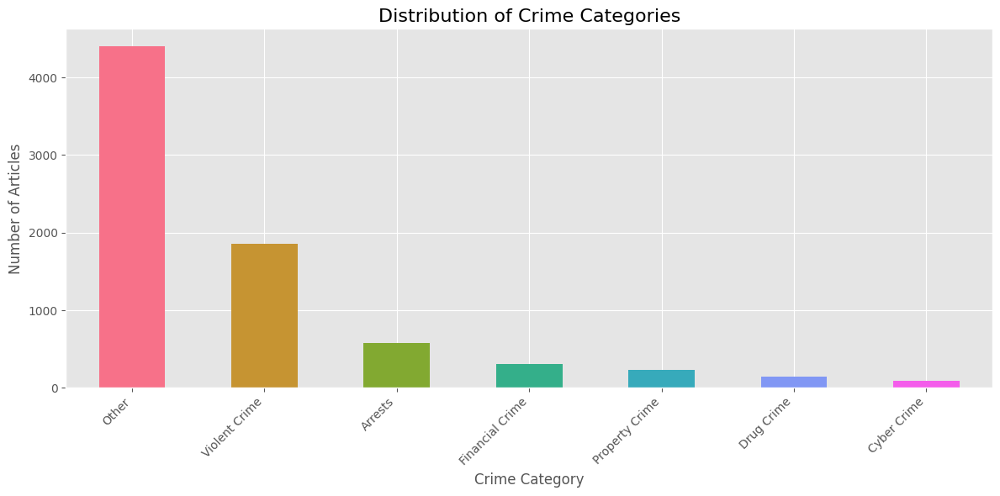

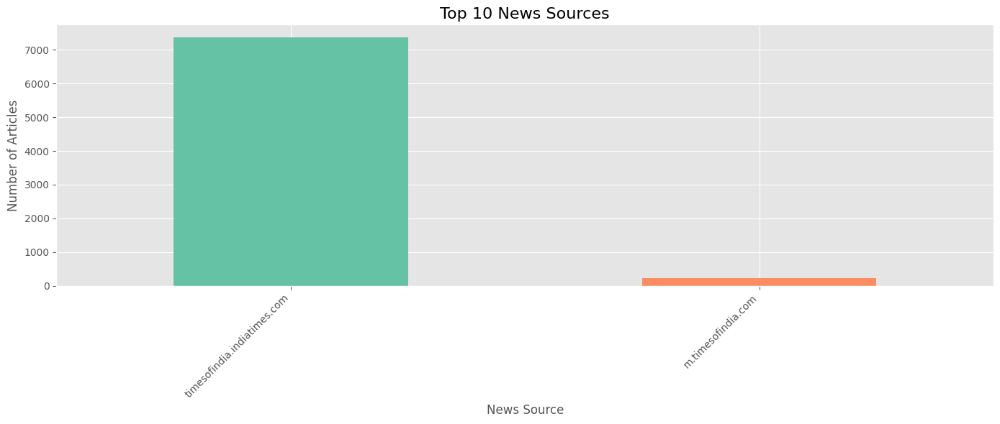

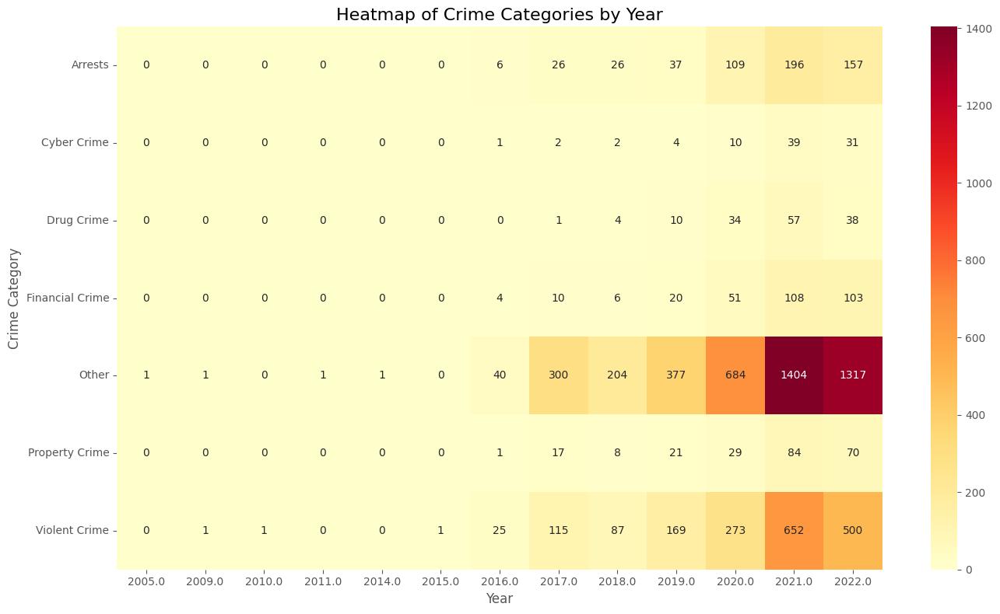

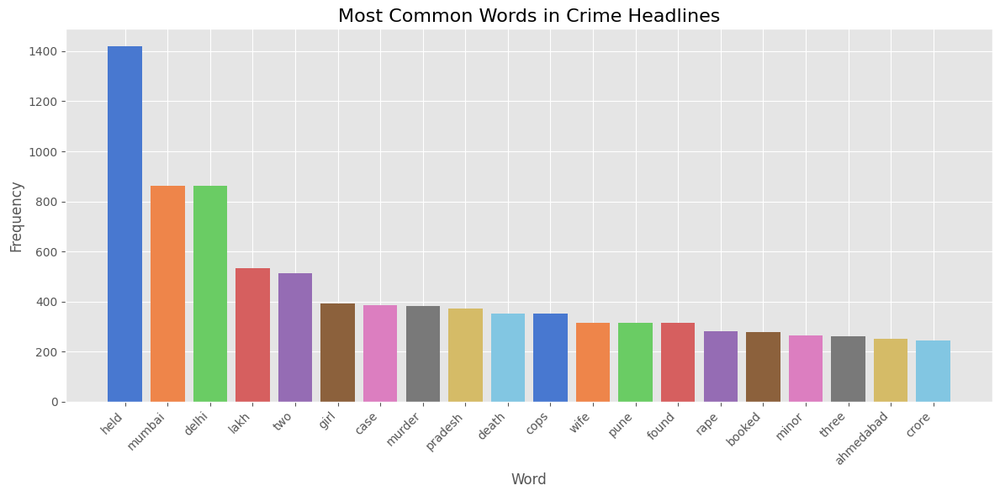


TEXT SEARCH EXAMPLES

Basic search example (murder cases in Mumbai):
Found 0 articles matching your search criteria.
No results found.

Advanced search example (financial crimes in 2021-2022):
Found 170 articles matching your search criteria.
Displaying 5 of 170 results:
--------------------------------------------------------------------------------
1. Techie loses Rs 10 lakh to forex investment fraud in Pune
   Date: Nov 08, 2022.0 | Category: Financial Crime | Location: Unknown
   Summary: A software engineer (37) from Gahunje was duped by fraudsters of Rs10.17 lakh on the promise of handsome returns on investment in the capital market and in forex.The techie made the investment in phas...
   Link: https://timesofindia.indiatimes.com/city/pune/techie-loses-10-lakh-to-forex-investment-fraud/articleshow/95368653.cms
--------------------------------------------------------------------------------
2. Spa owner, others lose Rs 68 lakh to fraudster in Bengaluru
   Date: Nov 04, 2022.0 | 

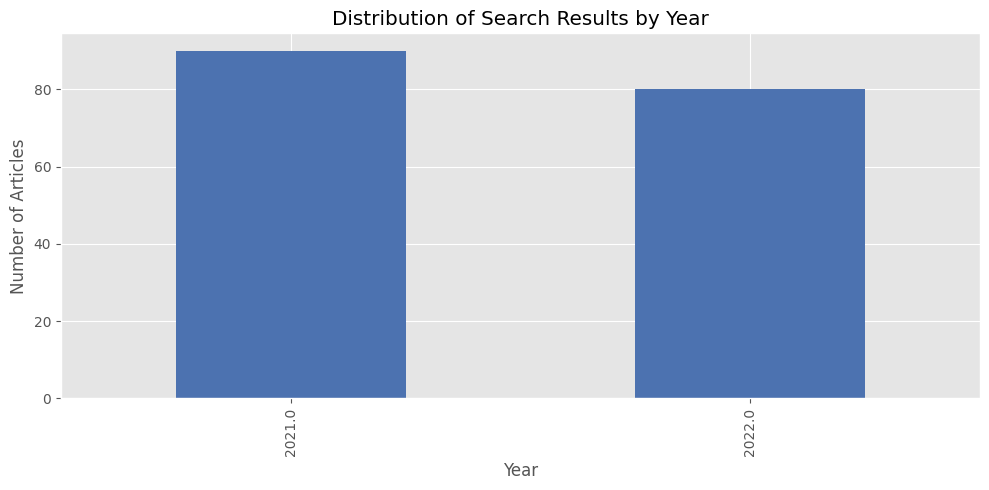

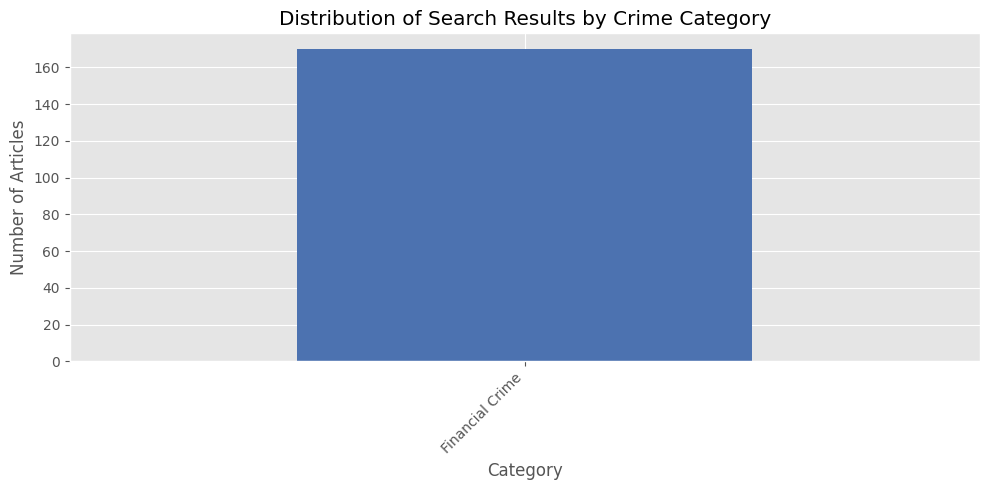

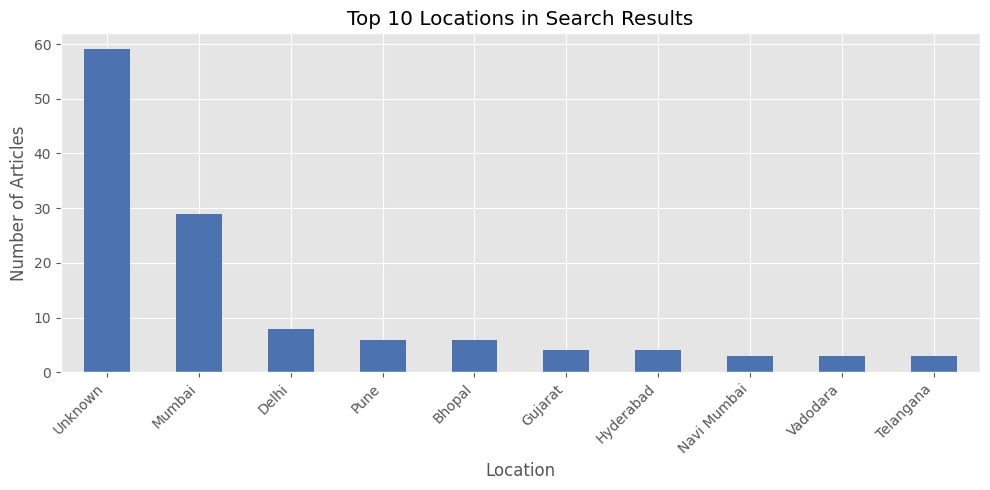

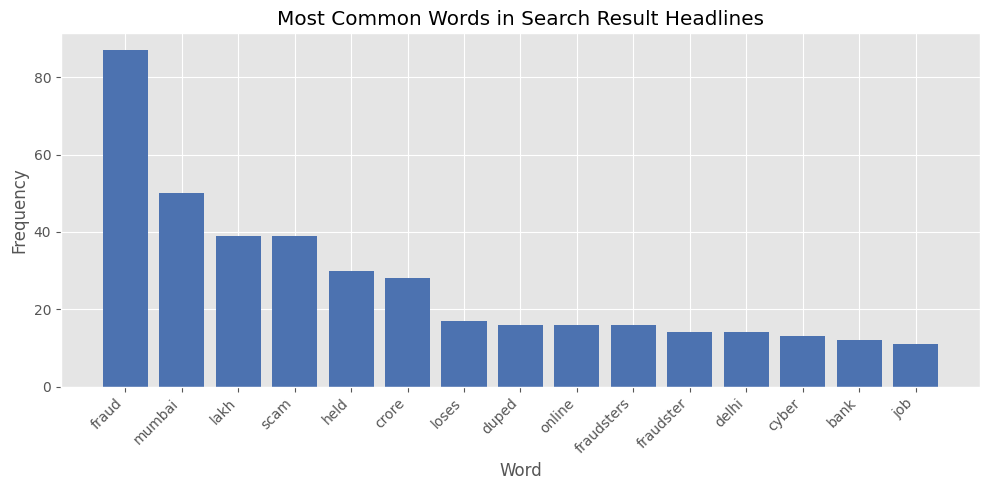

In [ ]:
"""
# Crime Articles Analysis - Basic Analysis & Text Search
This notebook loads the crime article dataset and provides basic statistics and visualization,
along with text search functionality.
"""

# Install required libraries
#!pip install pandas matplotlib seaborn nltk wordcloud

# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from collections import Counter
from datetime import datetime
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import os

# Download NLTK resources
nltk.download('punkt')
nltk.download('stopwords')

# Define function to load and clean data
def load_and_clean_data(file_path):
    """
    Load the CSV file and clean the data
    """
    # Read the CSV file
    df = pd.read_csv(file_path)

    # Clean up column names and whitespace
    df.columns = df.columns.str.strip()
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].str.strip()

    # Clean the Year column
    def extract_year(year_str):
        if pd.isna(year_str):
            return None

        # Try to extract a 4-digit year
        matches = re.findall(r'20\d\d', str(year_str))
        if matches:
            return int(matches[0])
        return None

    df['clean_year'] = df['Year'].apply(extract_year)

    # Categorize crime types
    crime_categories = {
        "Violent Crime": ["murder", "killing", "killed", "homicide", "shooting", "shot", "stabbing", "assault", "violence", "rape", "sexual"],
        "Property Crime": ["theft", "robbery", "burglary", "stolen", "break-in", "vandalism", "damage"],
        "Financial Crime": ["fraud", "scam", "embezzlement", "money", "bribery", "corruption"],
        "Drug Crime": ["drug", "narcotic", "cocaine", "heroin", "marijuana", "cannabis"],
        "Cyber Crime": ["hack", "cyber", "online fraud", "identity theft", "phishing"],
        "Arrests": ["arrest", "detained", "custody", "charged", "jailed", "sentenced"]
    }

    def categorize_crime(heading):
        if pd.isna(heading):
            return "Uncategorized"

        heading_lower = heading.lower()
        for category, terms in crime_categories.items():
            if any(term in heading_lower for term in terms):
                return category
        return "Other"

    df['crime_category'] = df['heading'].apply(categorize_crime)

    # Extract locations from headlines
    def extract_location(heading):
        if pd.isna(heading):
            return "Unknown"

        # Simple colon-based location extraction (e.g., "Mumbai: ...")
        colon_match = re.match(r'^([A-Za-z\s]+):', heading)
        if colon_match:
            location = colon_match.group(1).strip()
            return location

        return "Unknown"

    df['location'] = df['heading'].apply(extract_location)

    # Extract news sources
    def extract_domain(url):
        if pd.isna(url):
            return "Unknown"

        # Simple regex to extract domain
        match = re.search(r'https?://(?:www\.)?([^/]+)', url)
        if match:
            return match.group(1)
        return "Unknown"

    df['source'] = df['article_link'].apply(extract_domain)

    return df

# Function to analyze data
def analyze_data(df):
    """
    Perform analysis on the cleaned data
    """
    print(f"Total number of articles: {len(df)}")

    # Articles by year
    year_counts = df['clean_year'].value_counts().sort_index()
    print("\nArticles by year:")
    print(year_counts)

    # Crime categories
    category_counts = df['crime_category'].value_counts()
    print("\nArticles by crime category:")
    print(category_counts)

    # Extract news sources
    source_counts = df['source'].value_counts().head(10)
    print("\nTop 10 news sources:")
    print(source_counts)

    return {
        'year_counts': year_counts,
        'category_counts': category_counts,
        'source_counts': source_counts
    }

# Function to plot visualizations
# Function to plot visualizations
def plot_visualizations(analysis_results, show_plots=True, save_path="plots"):
    """
    Create visualizations from the analysis results and save them with 300 DPI
    """
    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Set style for plots
    plt.style.use('ggplot')
    sns.set_palette("deep")

    # Plot articles by year
    plt.figure(figsize=(12, 6))
    analysis_results['year_counts'].plot(kind='bar')
    plt.title('Number of Crime Articles by Year', fontsize=16)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Number of Articles', fontsize=12)
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'articles_by_year.png'), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

    # Plot crime categories
    plt.figure(figsize=(12, 6))
    analysis_results['category_counts'].plot(kind='bar', color=sns.color_palette("husl", len(analysis_results['category_counts'])))
    plt.title('Distribution of Crime Categories', fontsize=16)
    plt.xlabel('Crime Category', fontsize=12)
    plt.ylabel('Number of Articles', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'crime_categories.png'), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

    # Plot top news sources
    plt.figure(figsize=(14, 6))
    analysis_results['source_counts'].plot(kind='bar', color=sns.color_palette("Set2", len(analysis_results['source_counts'])))
    plt.title('Top 10 News Sources', fontsize=16)
    plt.xlabel('News Source', fontsize=12)
    plt.ylabel('Number of Articles', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'top_news_sources.png'), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

# Create a crime heatmap
def create_crime_heatmap(df, show_plots=True, save_path="plots"):
    """
    Create a heatmap showing crime categories by year and save with 300 DPI
    """
    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Create a pivot table
    pivot = pd.pivot_table(
        df,
        values='heading',
        index='crime_category',
        columns='clean_year',
        aggfunc='count',
        fill_value=0
    )

    plt.figure(figsize=(14, 8))
    sns.heatmap(pivot, annot=True, fmt='g', cmap='YlOrRd')
    plt.title('Heatmap of Crime Categories by Year', fontsize=16)
    plt.ylabel('Crime Category', fontsize=12)
    plt.xlabel('Year', fontsize=12)
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'crime_heatmap.png'), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

# Analyze content trends
def analyze_content_trends(df, show_plots=True, save_path="plots"):
    """
    Analyze common words in headlines and save the plot with 300 DPI
    """
    from collections import Counter

    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Process headlines
    all_headline_words = ' '.join(df['heading'].dropna()).lower()
    headline_words = re.findall(r'\b[a-z]{3,15}\b', all_headline_words)

    # Get stopwords
    stop_words = set(stopwords.words('english'))
    custom_stop_words = ['police', 'man', 'woman', 'year', 'old', 'arrested', 'charged']
    stop_words.update(custom_stop_words)

    headline_words = [word for word in headline_words if word not in stop_words]

    headline_counter = Counter(headline_words).most_common(20)

    # Plot most common words in headlines
    plt.figure(figsize=(12, 6))
    words, counts = zip(*headline_counter)
    plt.bar(words, counts, color=sns.color_palette("muted", len(words)))
    plt.title('Most Common Words in Crime Headlines', fontsize=16)
    plt.xlabel('Word', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'common_words_headlines.png'), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

    return headline_counter

# Function to analyze search results
def analyze_search_results(results_df, save_path="plots"):
    """
    Analyze the search results to find patterns and save plots with 300 DPI
    """
    if len(results_df) == 0:
        print("No results to analyze.")
        return

    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    print(f"Analysis of {len(results_df)} search results:")

    # Distribution by year
    year_counts = results_df['clean_year'].value_counts().sort_index()

    plt.figure(figsize=(10, 5))
    year_counts.plot(kind='bar')
    plt.title('Distribution of Search Results by Year')
    plt.xlabel('Year')
    plt.ylabel('Number of Articles')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'search_results_by_year.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    # Distribution by category
    category_counts = results_df['crime_category'].value_counts()

    plt.figure(figsize=(10, 5))
    category_counts.plot(kind='bar')
    plt.title('Distribution of Search Results by Crime Category')
    plt.xlabel('Category')
    plt.ylabel('Number of Articles')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'search_results_by_category.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    # Distribution by location (top 10)
    location_counts = results_df['location'].value_counts().head(10)

    plt.figure(figsize=(10, 5))
    location_counts.plot(kind='bar')
    plt.title('Top 10 Locations in Search Results')
    plt.xlabel('Location')
    plt.ylabel('Number of Articles')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'search_results_by_location.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    # Common words in result headlines
    all_headlines = ' '.join(results_df['heading'].dropna()).lower()
    words = re.findall(r'\b[a-z]{3,15}\b', all_headlines)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    custom_stop_words = ['police', 'man', 'woman', 'year', 'old', 'arrested', 'charged']
    stop_words.update(custom_stop_words)

    filtered_words = [word for word in words if word not in stop_words]
    word_counts = Counter(filtered_words).most_common(15)

    # Plot word frequencies
    plt.figure(figsize=(10, 5))
    words, counts = zip(*word_counts)
    plt.bar(words, counts)
    plt.title('Most Common Words in Search Result Headlines')
    plt.xlabel('Word')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'search_results_common_words.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Create a crime heatmap
def create_crime_heatmap(df, show_plots=True, save_path="plots"):
    """
    Create a heatmap showing crime categories by year and save with 300 DPI
    """
    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Create a pivot table
    pivot = pd.pivot_table(
        df,
        values='heading',
        index='crime_category',
        columns='clean_year',
        aggfunc='count',
        fill_value=0
    )

    plt.figure(figsize=(14, 8))
    sns.heatmap(pivot, annot=True, fmt='g', cmap='YlOrRd')
    plt.title('Heatmap of Crime Categories by Year', fontsize=16)
    plt.ylabel('Crime Category', fontsize=12)
    plt.xlabel('Year', fontsize=12)
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'crime_heatmap.png'), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

# Analyze content trends
def analyze_content_trends(df, show_plots=True, save_path="plots"):
    """
    Analyze common words in headlines and save the plot with 300 DPI
    """
    from collections import Counter

    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Process headlines
    all_headline_words = ' '.join(df['heading'].dropna()).lower()
    headline_words = re.findall(r'\b[a-z]{3,15}\b', all_headline_words)

    # Get stopwords
    stop_words = set(stopwords.words('english'))
    custom_stop_words = ['police', 'man', 'woman', 'year', 'old', 'arrested', 'charged']
    stop_words.update(custom_stop_words)

    headline_words = [word for word in headline_words if word not in stop_words]

    headline_counter = Counter(headline_words).most_common(20)

    # Plot most common words in headlines
    plt.figure(figsize=(12, 6))
    words, counts = zip(*headline_counter)
    plt.bar(words, counts, color=sns.color_palette("muted", len(words)))
    plt.title('Most Common Words in Crime Headlines', fontsize=16)
    plt.xlabel('Word', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'common_words_headlines.png'), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

    return headline_counter

# Text search function
def search_crime_articles(df, query, search_columns=['heading', 'content_summary'], case_sensitive=False):
    """
    Search for specific terms in the crime articles dataset

    Parameters:
    - df: The pandas DataFrame containing the crime articles
    - query: String or list of strings to search for
    - search_columns: List of column names to search within
    - case_sensitive: Whether the search should be case sensitive

    Returns:
    - Filtered DataFrame containing articles matching the search query
    """
    if isinstance(query, str):
        query = [query]  # Convert single string to list

    # Initialize an empty mask
    mask = pd.Series(False, index=df.index)

    for term in query:
        term_mask = pd.Series(False, index=df.index)

        for column in search_columns:
            if column not in df.columns:
                print(f"Warning: Column '{column}' not found in the DataFrame")
                continue

            if case_sensitive:
                column_mask = df[column].str.contains(term, na=False)
            else:
                column_mask = df[column].str.contains(term, case=False, na=False)

            term_mask = term_mask | column_mask

        mask = mask | term_mask

    results = df[mask].copy()
    print(f"Found {len(results)} articles matching your search criteria.")

    return results

# Advanced search function with multiple conditions
def advanced_search(df, criteria=None):
    """
    Perform an advanced search with multiple criteria on the crime articles dataset

    Parameters:
    - df: The pandas DataFrame containing the crime articles
    - criteria: Dictionary of search criteria with the following possible keys:
        * 'keywords': List of terms to search for in text columns
        * 'exclude': List of terms to exclude
        * 'category': List of crime categories to include
        * 'year': List of years or a range tuple (start_year, end_year)
        * 'location': List of locations to include
        * 'source': List of news sources
        * 'columns': List of columns to search in for keywords (default: ['heading', 'content_summary'])
        * 'case_sensitive': Boolean for case sensitivity (default: False)
        * 'match_all': Boolean, if True all keywords must be present (default: False)

    Returns:
    - Filtered DataFrame containing articles matching all criteria
    """
    if criteria is None:
        criteria = {}

    result_df = df.copy()

    # Check for keywords to include
    if 'keywords' in criteria and criteria['keywords']:
        keywords = criteria['keywords'] if isinstance(criteria['keywords'], list) else [criteria['keywords']]
        columns = criteria.get('columns', ['heading', 'content_summary'])
        case_sensitive = criteria.get('case_sensitive', False)
        match_all = criteria.get('match_all', False)

        if match_all:
            # All keywords must be present
            for term in keywords:
                term_mask = pd.Series(False, index=result_df.index)

                for column in columns:
                    if column in result_df.columns:
                        if case_sensitive:
                            column_mask = result_df[column].str.contains(term, na=False)
                        else:
                            column_mask = result_df[column].str.contains(term, case=False, na=False)

                        term_mask = term_mask | column_mask

                result_df = result_df[term_mask]
        else:
            # Any keyword can be present
            mask = pd.Series(False, index=result_df.index)

            for term in keywords:
                term_mask = pd.Series(False, index=result_df.index)

                for column in columns:
                    if column in result_df.columns:
                        if case_sensitive:
                            column_mask = result_df[column].str.contains(term, na=False)
                        else:
                            column_mask = result_df[column].str.contains(term, case=False, na=False)

                        term_mask = term_mask | column_mask

                mask = mask | term_mask

            result_df = result_df[mask]

    # Check for terms to exclude
    if 'exclude' in criteria and criteria['exclude']:
        exclude_terms = criteria['exclude'] if isinstance(criteria['exclude'], list) else [criteria['exclude']]
        columns = criteria.get('columns', ['heading', 'content_summary'])
        case_sensitive = criteria.get('case_sensitive', False)

        for term in exclude_terms:
            exclude_mask = pd.Series(False, index=result_df.index)

            for column in columns:
                if column in result_df.columns:
                    if case_sensitive:
                        column_mask = result_df[column].str.contains(term, na=False)
                    else:
                        column_mask = result_df[column].str.contains(term, case=False, na=False)

                    exclude_mask = exclude_mask | column_mask

            result_df = result_df[~exclude_mask]

    # Filter by crime category
    if 'category' in criteria and criteria['category']:
        categories = criteria['category'] if isinstance(criteria['category'], list) else [criteria['category']]
        result_df = result_df[result_df['crime_category'].isin(categories)]

    # Filter by year
    if 'year' in criteria:
        year_criteria = criteria['year']
        if isinstance(year_criteria, list):
            # List of specific years
            result_df = result_df[result_df['clean_year'].isin(year_criteria)]
        elif isinstance(year_criteria, tuple) and len(year_criteria) == 2:
            # Range of years (start_year, end_year)
            start_year, end_year = year_criteria
            result_df = result_df[(result_df['clean_year'] >= start_year) & (result_df['clean_year'] <= end_year)]
        elif isinstance(year_criteria, int):
            # Single year
            result_df = result_df[result_df['clean_year'] == year_criteria]

    # Filter by location
    if 'location' in criteria and criteria['location']:
        locations = criteria['location'] if isinstance(criteria['location'], list) else [criteria['location']]

        # Handle both exact matches and partial matches
        location_mask = pd.Series(False, index=result_df.index)
        for loc in locations:
            if criteria.get('location_exact', False):
                # Exact location match
                mask = result_df['location'] == loc
            else:
                # Partial location match
                mask = result_df['location'].str.contains(loc, case=False, na=False)
            location_mask = location_mask | mask

        result_df = result_df[location_mask]

    # Filter by source
    if 'source' in criteria and criteria['source']:
        sources = criteria['source'] if isinstance(criteria['source'], list) else [criteria['source']]
        result_df = result_df[result_df['source'].isin(sources)]

    print(f"Found {len(result_df)} articles matching your search criteria.")
    return result_df

# Display search results in a useful format
def display_search_results(results_df, max_results=20, show_summary=True):
    """
    Display search results in a readable format

    Parameters:
    - results_df: DataFrame containing search results
    - max_results: Maximum number of results to display
    - show_summary: Whether to show the content summary

    Returns:
    - None (prints results)
    """
    if len(results_df) == 0:
        print("No results found.")
        return

    print(f"Displaying {min(max_results, len(results_df))} of {len(results_df)} results:")
    print("-" * 80)

    for i, (idx, row) in enumerate(results_df.head(max_results).iterrows()):
        print(f"{i+1}. {row['heading']}")
        print(f"   Date: {row['month_date']}, {row['clean_year']} | Category: {row['crime_category']} | Location: {row['location']}")

        if show_summary and 'content_summary' in row:
            print(f"   Summary: {row['content_summary'][:200]}...")

        print(f"   Link: {row['article_link']}")
        print("-" * 80)

# Function to analyze search results
def analyze_search_results(results_df, save_path="plots"):
    """
    Analyze the search results to find patterns and save plots with 300 DPI
    """
    if len(results_df) == 0:
        print("No results to analyze.")
        return

    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    print(f"Analysis of {len(results_df)} search results:")

    # Distribution by year
    year_counts = results_df['clean_year'].value_counts().sort_index()

    plt.figure(figsize=(10, 5))
    year_counts.plot(kind='bar')
    plt.title('Distribution of Search Results by Year')
    plt.xlabel('Year')
    plt.ylabel('Number of Articles')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'search_results_by_year.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    # Distribution by category
    category_counts = results_df['crime_category'].value_counts()

    plt.figure(figsize=(10, 5))
    category_counts.plot(kind='bar')
    plt.title('Distribution of Search Results by Crime Category')
    plt.xlabel('Category')
    plt.ylabel('Number of Articles')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'search_results_by_category.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    # Distribution by location (top 10)
    location_counts = results_df['location'].value_counts().head(10)

    plt.figure(figsize=(10, 5))
    location_counts.plot(kind='bar')
    plt.title('Top 10 Locations in Search Results')
    plt.xlabel('Location')
    plt.ylabel('Number of Articles')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'search_results_by_location.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    # Common words in result headlines
    all_headlines = ' '.join(results_df['heading'].dropna()).lower()
    words = re.findall(r'\b[a-z]{3,15}\b', all_headlines)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    custom_stop_words = ['police', 'man', 'woman', 'year', 'old', 'arrested', 'charged']
    stop_words.update(custom_stop_words)

    filtered_words = [word for word in words if word not in stop_words]
    word_counts = Counter(filtered_words).most_common(15)

    # Plot word frequencies
    plt.figure(figsize=(10, 5))
    words, counts = zip(*word_counts)
    plt.bar(words, counts)
    plt.title('Most Common Words in Search Result Headlines')
    plt.xlabel('Word')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'search_results_common_words.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Sample usage
if __name__ == "__main__":
    # Check if file exists in current directory
    file_path = "7k  Unique crime articles.csv"
    if not os.path.exists(file_path):
        # Ask for file upload
        from google.colab import files
        uploaded = files.upload()
        file_path = next(iter(uploaded))

    # Load and clean the data
    df = load_and_clean_data(file_path)

    # Perform basic analysis
    analysis_results = analyze_data(df)

    # Generate visualizations
    plot_visualizations(analysis_results)
    create_crime_heatmap(df)
    analyze_content_trends(df)

    print("\n" + "="*50)
    print("TEXT SEARCH EXAMPLES")
    print("="*50)

    # Basic search example
    print("\nBasic search example (murder cases in Mumbai):")
    results = search_crime_articles(df, "mumbai murder")
    display_search_results(results, max_results=5)

    # Advanced search example
    print("\nAdvanced search example (financial crimes in 2021-2022):")
    criteria = {
        'category': 'Financial Crime',
        'year': (2021, 2022),
        'keywords': ['fraud', 'scam'],
        'match_all': False
    }
    results = advanced_search(df, criteria)
    display_search_results(results, max_results=5)

    # Analyze search results
    if len(results) > 0:
        analyze_search_results(results)

In [2]:
import nltk
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('maxent_ne_chunker_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data] Downloading package maxent_ne_chunker_tab to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping chunkers/maxent_ne_chunker_tab.zip.


True

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


CRIME ARTICLES TEXT ANALYSIS

Generating word clouds...


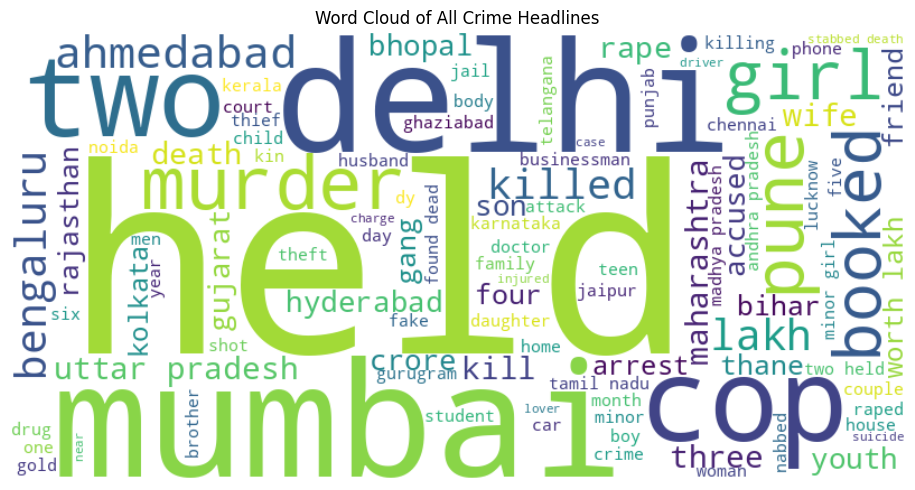

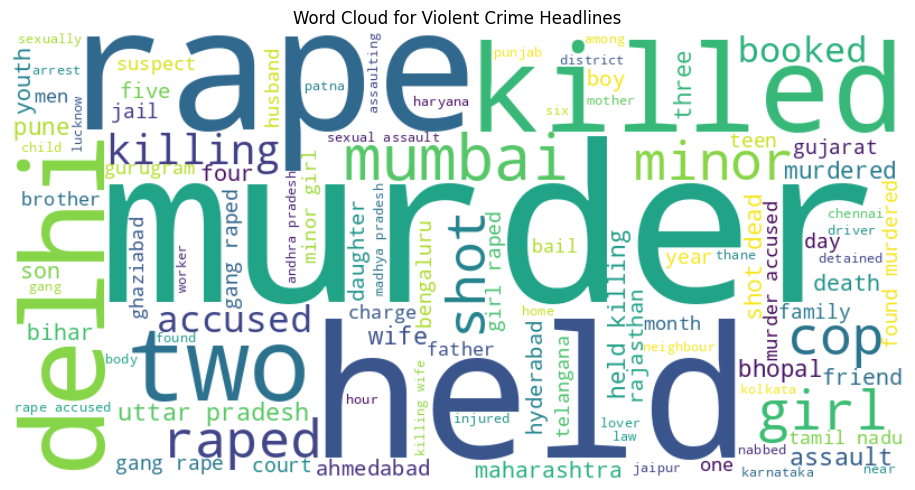

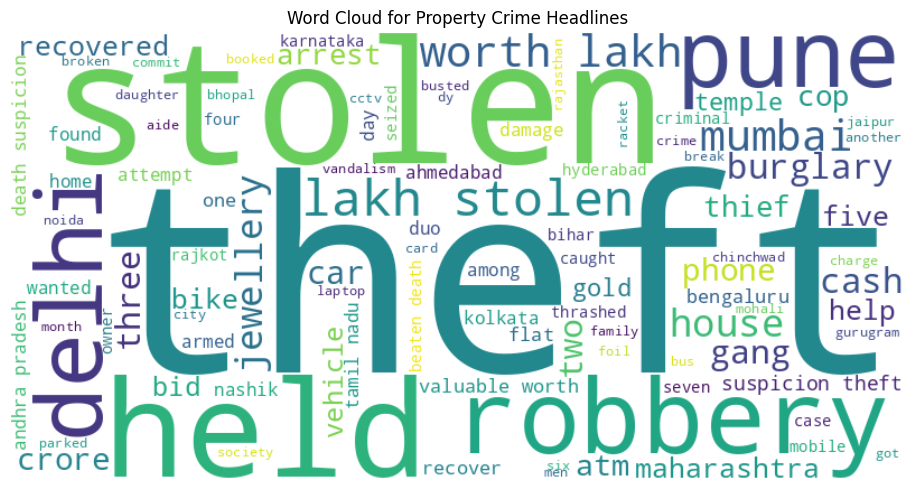

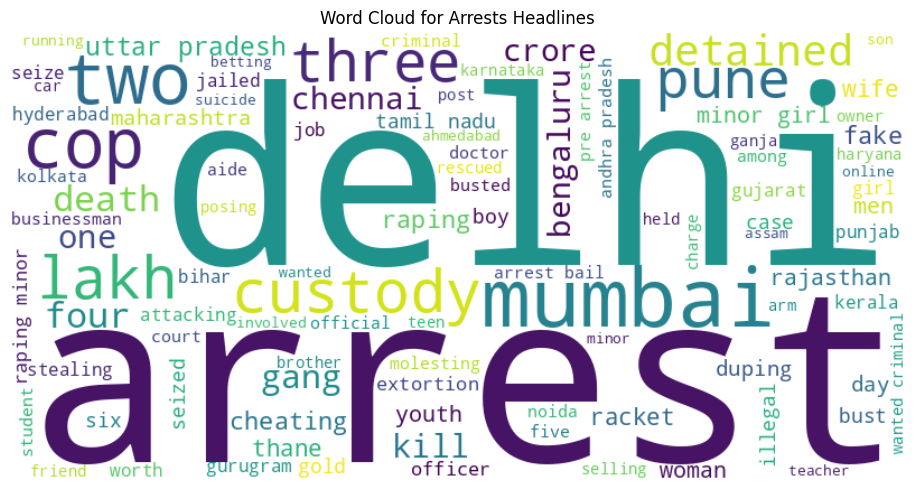

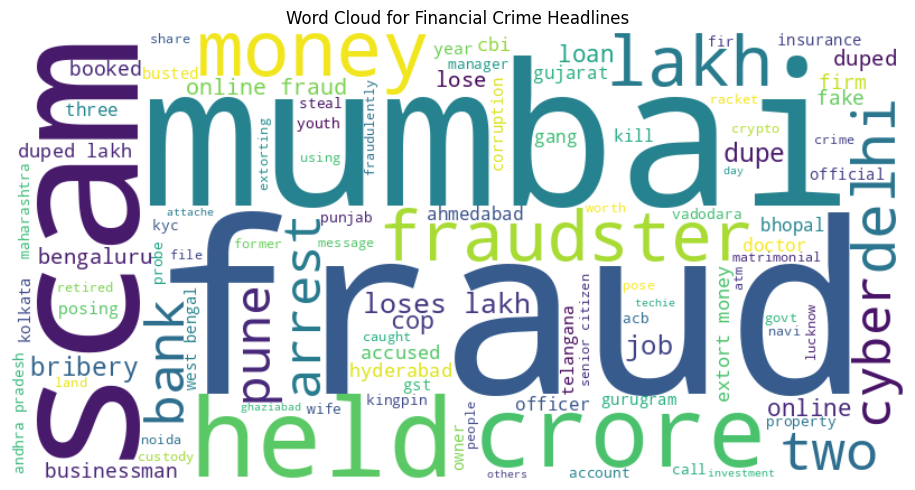

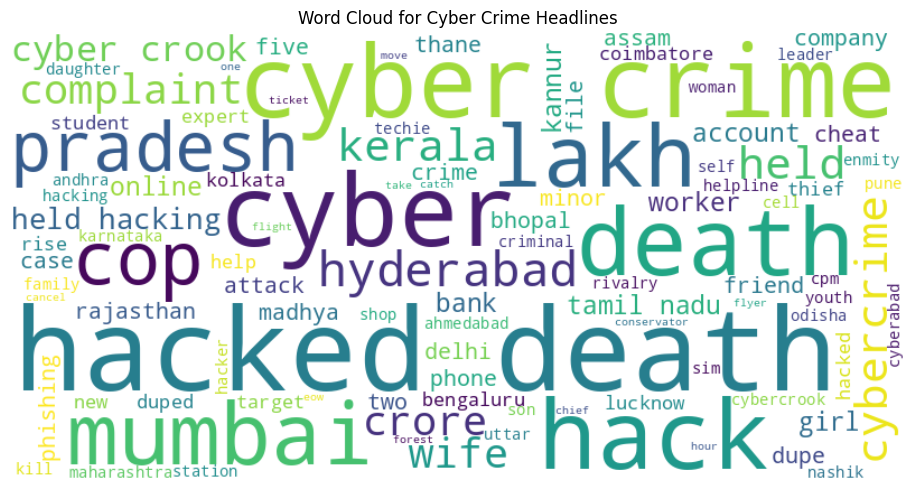

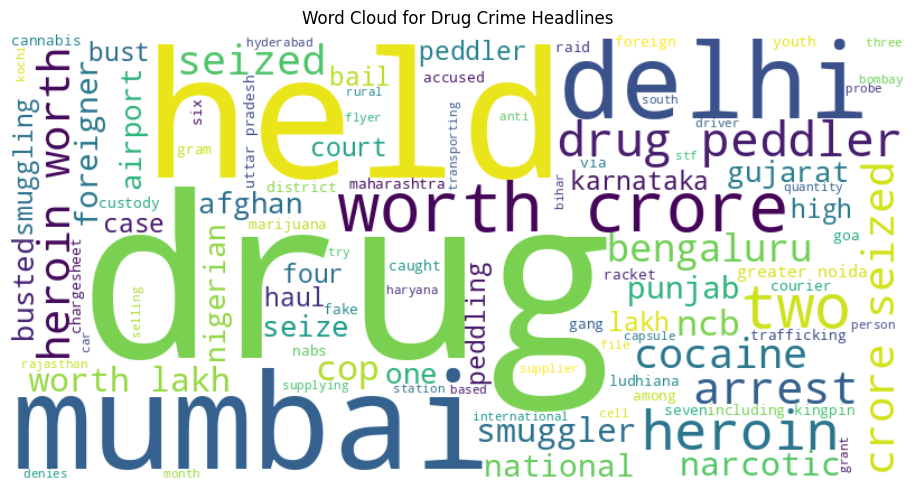


Extracting common bigrams...


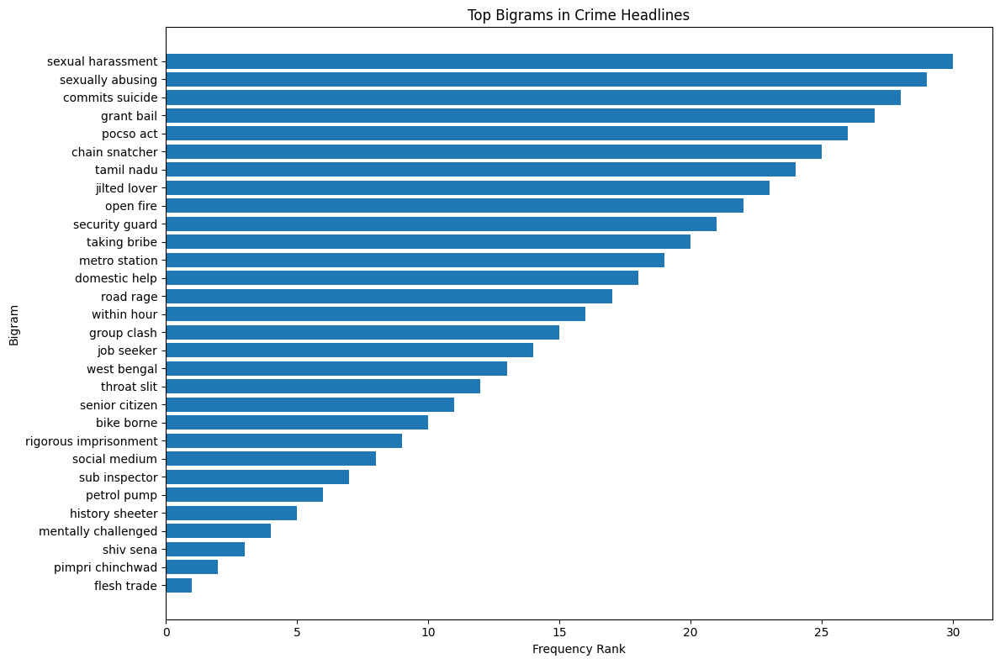


Analyzing sentiment patterns...


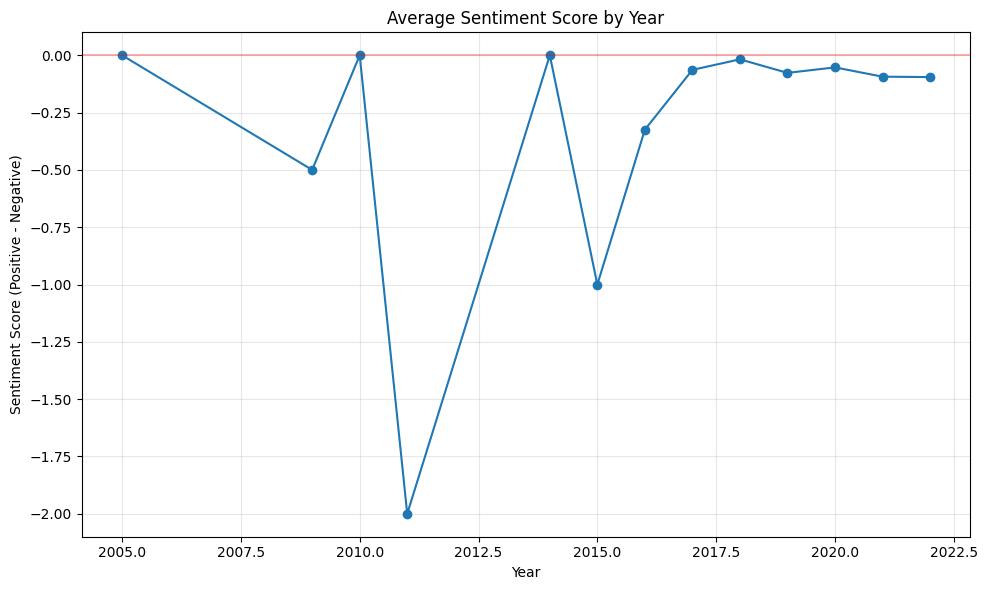

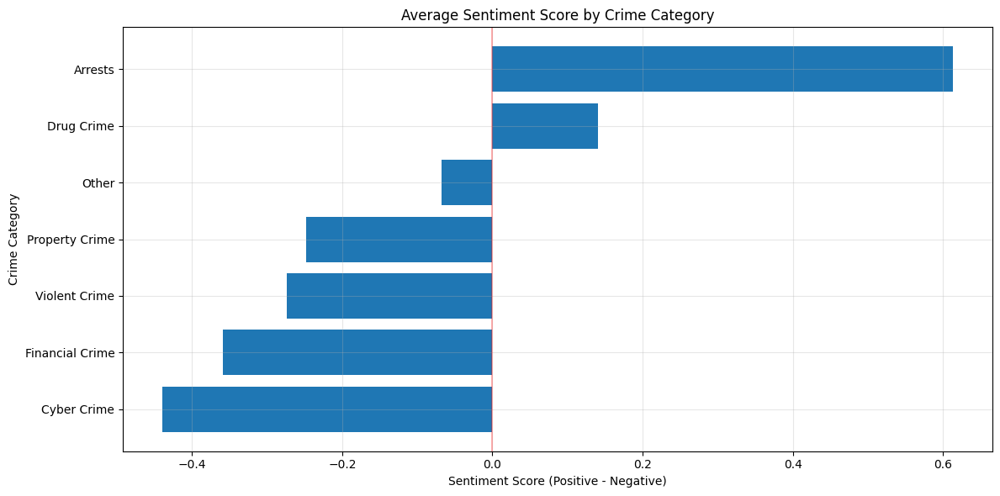


Performing topic modeling...
Topics identified by LDA:
Topic #1: crore, crime, people, two, allegedly, official, branch, gang, person, city
Topic #2: crime, court, accused, murder, case, high, city, state, singh, rape
Topic #3: lakh, allegedly, two, complaint, cash, worth, gold, social, bank, video
Topic #4: area, two, found, allegedly, district, night, near, delhi, body, saturday
Topic #5: court, year, imprisonment, girl, sentenced, sexually, life, accused, pocso, act
Topic #6: allegedly, girl, two, district, accused, death, wife, station, raped, village


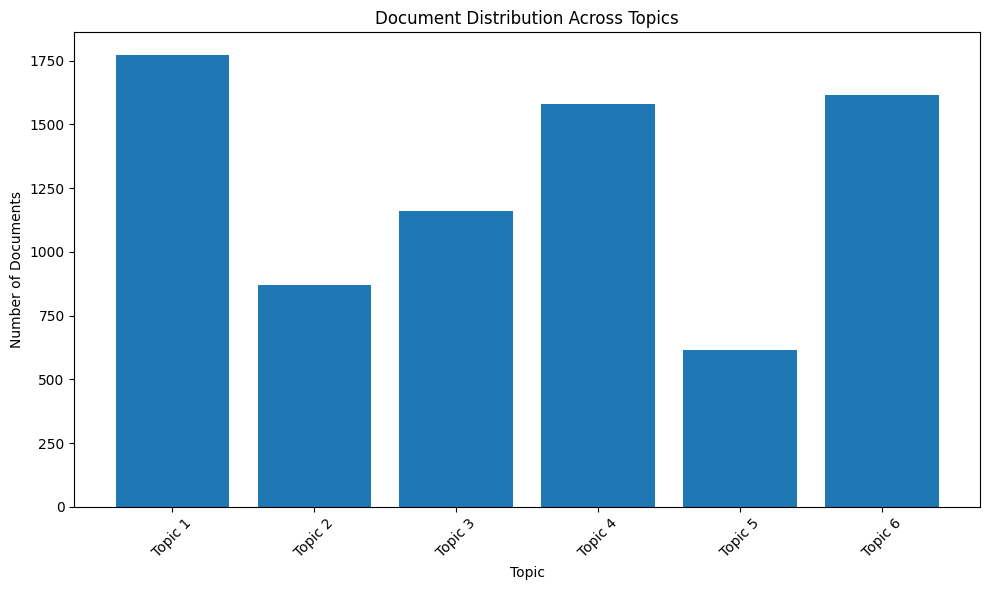


Analyzing headline patterns...


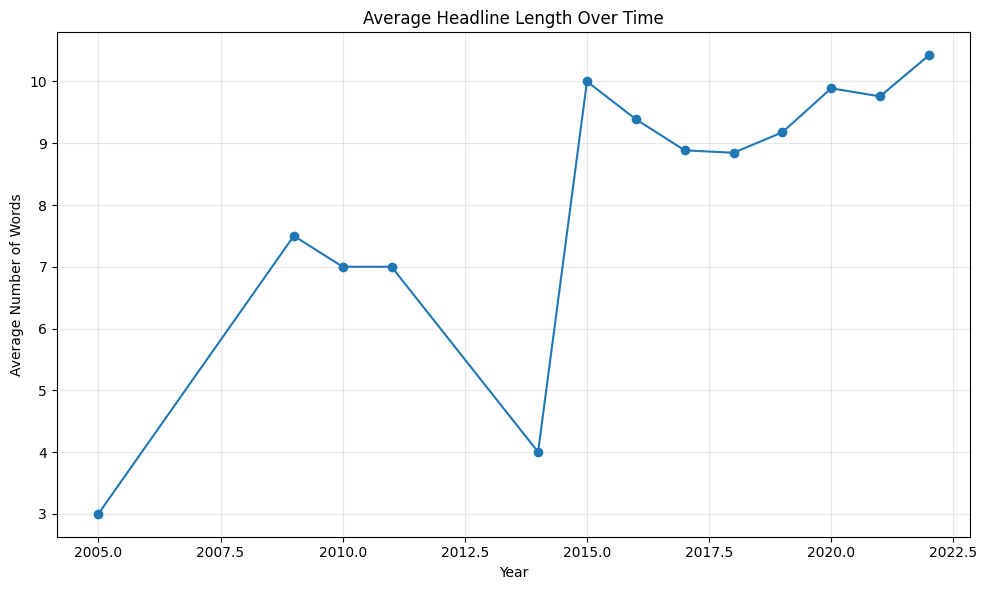

52.7% of headlines start with a location followed by a colon.


<Figure size 1200x800 with 0 Axes>

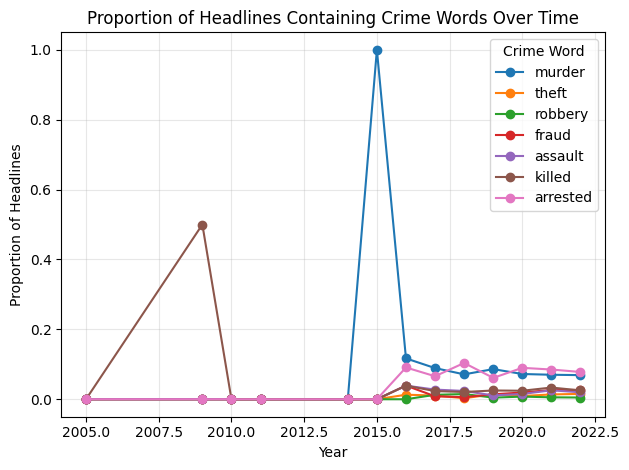


Extracting keywords using TF-IDF...


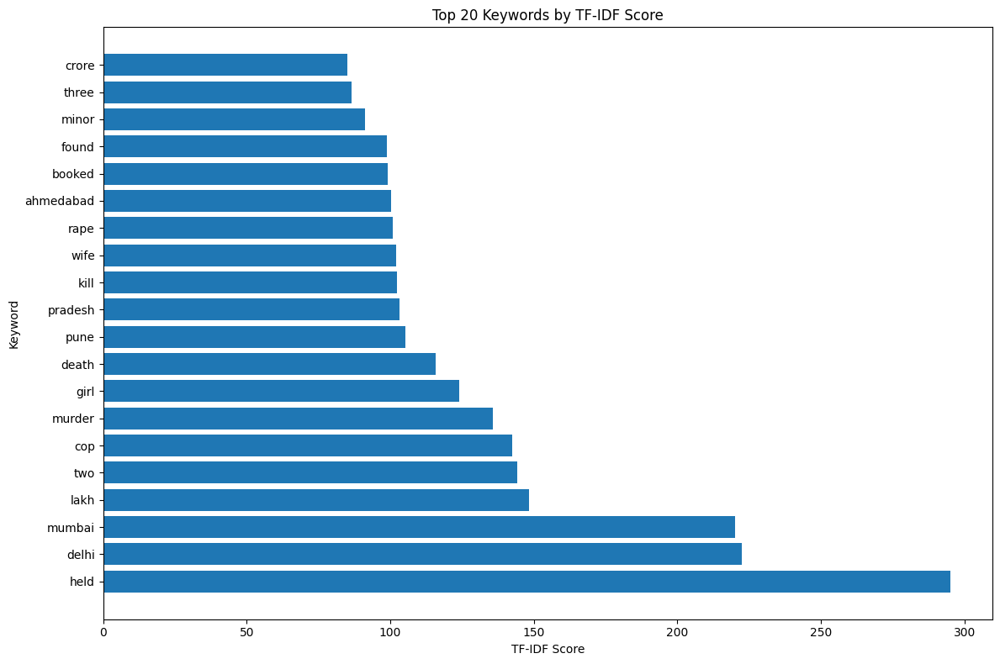


Creating interactive visualizations...



Extracting named entities (sample of 100 articles)...


[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping chunkers/maxent_ne_chunker.zip.
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


Processing 100 texts in batches of 20...
Processing batch 1/5...
Processing batch 2/5...
Processing batch 3/5...
Processing batch 4/5...
Processing batch 5/5...

Top 10 PERSON entities:
  Man: 9
  Woman: 5
  Tamil: 2
  Tihar Jail: 1
  Adarsh Nagar: 1
  Ashok Lahoti: 1
  Public: 1
  Andhra: 1
  Pradesh: 1
  Couple: 1

Top 10 ORGANIZATION entities:
  Jadavpur: 1
  BJP: 1
  TDP: 1
  CBI: 1
  Marve: 1
  IDA Bollaram: 1
  SHO: 1
  Singhu Border: 1
  Mallanna: 1
  Dadar: 1

Top 10 GPE entities:
  Delhi: 20
  Mumbai: 7
  Ahmedabad: 5
  Pune: 5
  Thane: 3
  Bengaluru: 3
  Odisha: 2
  Karnataka: 2
  UP: 2
  Jaipur: 2

Text analysis complete!


In [1]:
"""
# Crime Articles Text Analysis
This notebook performs advanced text analysis on the crime articles dataset,
including word clouds, sentiment analysis, topic modeling, and more.
"""

# Install required libraries
#!pip install pandas matplotlib seaborn nltk wordcloud scikit-learn plotly

# Import libraries
import kaleido
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from collections import Counter, defaultdict
import os
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF
from wordcloud import WordCloud
import plotly.express as px
import plotly.graph_objects as go

# Download NLTK resources
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Define function to load and clean data
def load_and_clean_data(file_path):
    """
    Load the CSV file and clean the data
    """
    # Read the CSV file
    df = pd.read_csv(file_path)

    # Clean up column names and whitespace
    df.columns = df.columns.str.strip()
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].str.strip()

    # Clean the Year column
    def extract_year(year_str):
        if pd.isna(year_str):
            return None

        # Try to extract a 4-digit year
        matches = re.findall(r'20\d\d', str(year_str))
        if matches:
            return int(matches[0])
        return None

    df['clean_year'] = df['Year'].apply(extract_year)

    # Categorize crime types
    crime_categories = {
        "Violent Crime": ["murder", "killing", "killed", "homicide", "shooting", "shot", "stabbing", "assault", "violence", "rape", "sexual"],
        "Property Crime": ["theft", "robbery", "burglary", "stolen", "break-in", "vandalism", "damage"],
        "Financial Crime": ["fraud", "scam", "embezzlement", "money", "bribery", "corruption"],
        "Drug Crime": ["drug", "narcotic", "cocaine", "heroin", "marijuana", "cannabis"],
        "Cyber Crime": ["hack", "cyber", "online fraud", "identity theft", "phishing"],
        "Arrests": ["arrest", "detained", "custody", "charged", "jailed", "sentenced"]
    }

    def categorize_crime(heading):
        if pd.isna(heading):
            return "Uncategorized"

        heading_lower = heading.lower()
        for category, terms in crime_categories.items():
            if any(term in heading_lower for term in terms):
                return category
        return "Other"

    df['crime_category'] = df['heading'].apply(categorize_crime)

    return df

# Text preprocessing function
def preprocess_text(text, remove_stopwords=True):
    """
    Preprocess text data for analysis
    """
    if pd.isna(text):
        return ""

    # Convert to lowercase
    text = text.lower()

    # Remove punctuation and numbers
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'\d+', ' ', text)

    # Tokenize
    tokens = word_tokenize(text)

    # Remove stopwords if specified
    if remove_stopwords:
        stop_words = set(stopwords.words('english'))
        # Add custom stop words for crime articles
        custom_stop_words = ['police', 'man', 'woman', 'year', 'old', 'said', 'say', 'says',
                            'arrested', 'charged', 'case', 'article', 'news', 'report', 'told']
        stop_words.update(custom_stop_words)
        tokens = [word for word in tokens if word not in stop_words and len(word) > 2]

    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Join back into string
    return ' '.join(tokens)

# Generate word clouds
def generate_word_clouds(df, show_plots=True, save_path="plots2"):
    """
    Generate word clouds for different crime categories and save with 300 DPI
    """
    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Overall word cloud
    all_text = ' '.join(df['heading'].dropna())
    all_text = preprocess_text(all_text)

    wordcloud = WordCloud(width=800, height=400, background_color='white',
                         max_words=100, contour_width=3, contour_color='steelblue')
    wordcloud.generate(all_text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of All Crime Headlines')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'word_cloud_all_headlines.png'), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

    # Generate word cloud for each crime category
    for category in df['crime_category'].unique():
        if category == 'Other' or category == 'Uncategorized':
            continue

        category_df = df[df['crime_category'] == category]
        if len(category_df) < 10:  # Skip categories with too few articles
            continue

        category_text = ' '.join(category_df['heading'].dropna())
        category_text = preprocess_text(category_text)

        if not category_text.strip():  # Skip if no text after preprocessing
            continue

        wordcloud = WordCloud(width=800, height=400, background_color='white',
                            max_words=100, contour_width=3, contour_color='steelblue')
        wordcloud.generate(category_text)

        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for {category} Headlines')
        plt.tight_layout()
        if save_path:
            # Sanitize category name for filename
            safe_category = re.sub(r'[^\w\s-]', '', category).replace(' ', '_')
            plt.savefig(os.path.join(save_path, f'word_cloud_{safe_category}.png'), dpi=300, bbox_inches='tight')
        if show_plots:
            plt.show()
        plt.close()

# Extract common bigrams
def extract_bigrams(df, column='heading', min_freq=10, show_plots=True, save_path="plots2"):
    """
    Extract common bigrams (two-word phrases) from text data and save plot with 300 DPI
    """
    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Combine all text
    all_text = ' '.join(df[column].dropna())
    all_text = preprocess_text(all_text, remove_stopwords=False)

    # Tokenize
    words = word_tokenize(all_text)

    # Get stopwords for filtering
    stop_words = set(stopwords.words('english'))

    # Find bigrams
    bigram_measures = BigramAssocMeasures()
    finder = BigramCollocationFinder.from_words(words)

    # Filter out bigrams with stopwords
    finder.apply_freq_filter(min_freq)
    finder.apply_word_filter(lambda word: word in stop_words or len(word) < 3)

    # Get top bigrams by PMI (Pointwise Mutual Information)
    top_bigrams = finder.nbest(bigram_measures.pmi, 30)

    # Plot bigrams
    if show_plots or save_path:
        plt.figure(figsize=(12, 8))
        bigram_dict = {' '.join(bigram): i for i, bigram in enumerate(top_bigrams, 1)}
        plt.barh(list(bigram_dict.keys()), list(bigram_dict.values()))
        plt.title('Top Bigrams in Crime Headlines')
        plt.xlabel('Frequency Rank')
        plt.ylabel('Bigram')
        plt.tight_layout()
        if save_path:
            plt.savefig(os.path.join(save_path, 'top_bigrams.png'), dpi=300, bbox_inches='tight')
        if show_plots:
            plt.show()
        plt.close()

    return top_bigrams

# Sentiment analysis
def analyze_sentiment_patterns(df, column='heading', show_plots=True, save_path="plots2"):
    """
    Simple sentiment analysis using positive and negative word lists and save plots with 300 DPI
    """
    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Define positive and negative word lists (simplified version)
    positive_words = {
        'rescued', 'saved', 'recovery', 'recovered', 'solved', 'arrested', 'caught',
        'found', 'safe', 'resolve', 'resolved', 'survived', 'survivor', 'justice'
    }

    negative_words = {
        'murder', 'killed', 'death', 'dead', 'assault', 'attack', 'violence',
        'violent', 'crime', 'criminal', 'victim', 'injury', 'injured', 'fraud',
        'scam', 'theft', 'rob', 'robbed', 'robbery', 'threat', 'abuse', 'abused'
    }

    # Calculate sentiment scores
    df['positive_score'] = df[column].apply(
        lambda text: sum(1 for word in str(text).lower().split() if word in positive_words) if pd.notna(text) else 0
    )

    df['negative_score'] = df[column].apply(
        lambda text: sum(1 for word in str(text).lower().split() if word in negative_words) if pd.notna(text) else 0
    )

    df['sentiment_score'] = df['positive_score'] - df['negative_score']

    # Analyze sentiment by year and category
    yearly_sentiment = df.groupby('clean_year')['sentiment_score'].mean().reset_index()
    category_sentiment = df.groupby('crime_category')['sentiment_score'].mean().reset_index()

    # Plot sentiment over years
    if show_plots or save_path:
        plt.figure(figsize=(10, 6))
        plt.plot(yearly_sentiment['clean_year'], yearly_sentiment['sentiment_score'], marker='o')
        plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
        plt.title('Average Sentiment Score by Year')
        plt.xlabel('Year')
        plt.ylabel('Sentiment Score (Positive - Negative)')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        if save_path:
            plt.savefig(os.path.join(save_path, 'sentiment_by_year.png'), dpi=300, bbox_inches='tight')
        if show_plots:
            plt.show()
        plt.close()

        # Plot sentiment by category
        plt.figure(figsize=(12, 6))
        category_sentiment = category_sentiment.sort_values('sentiment_score')
        plt.barh(category_sentiment['crime_category'], category_sentiment['sentiment_score'])
        plt.axvline(x=0, color='r', linestyle='-', alpha=0.3)
        plt.title('Average Sentiment Score by Crime Category')
        plt.xlabel('Sentiment Score (Positive - Negative)')
        plt.ylabel('Crime Category')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        if save_path:
            plt.savefig(os.path.join(save_path, 'sentiment_by_category.png'), dpi=300, bbox_inches='tight')
        if show_plots:
            plt.show()
        plt.close()

    return yearly_sentiment, category_sentiment

# Topic modeling
def perform_topic_modeling(df, column='content_summary', n_topics=5, max_features=1000, show_plots=True, save_path="plots2"):
    """
    Perform topic modeling using Latent Dirichlet Allocation (LDA) and save plots with 300 DPI
    """
    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Preprocess text
    processed_text = df[column].fillna('').apply(preprocess_text)

    # Create document-term matrix
    vectorizer = CountVectorizer(max_features=max_features, min_df=5, max_df=0.9)
    dtm = vectorizer.fit_transform(processed_text)

    # Get feature names
    feature_names = vectorizer.get_feature_names_out()

    # Create and fit LDA model
    lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda_model.fit(dtm)

    # Get topics
    topics = []
    for topic_idx, topic in enumerate(lda_model.components_):
        top_words_idx = topic.argsort()[:-11:-1]  # Get indices of top 10 words
        top_words = [feature_names[i] for i in top_words_idx]
        topics.append((topic_idx, top_words))

    # Print topics
    print("Topics identified by LDA:")
    for topic_idx, top_words in topics:
        print(f"Topic #{topic_idx+1}: {', '.join(top_words)}")

    if show_plots or save_path:
        # Get topic distributions
        doc_topic_dist = lda_model.transform(dtm)

        # Assign main topic to each document
        df_topics = df.copy()
        df_topics['main_topic'] = np.argmax(doc_topic_dist, axis=1)
        df_topics['main_topic'] = df_topics['main_topic'].apply(lambda x: f"Topic {x+1}")

        # Plot topic distribution
        topic_counts = df_topics['main_topic'].value_counts().sort_index()

        plt.figure(figsize=(10, 6))
        plt.bar(topic_counts.index, topic_counts.values)
        plt.title('Document Distribution Across Topics')
        plt.xlabel('Topic')
        plt.ylabel('Number of Documents')
        plt.xticks(rotation=45)
        plt.tight_layout()
        if save_path:
            plt.savefig(os.path.join(save_path, 'topic_distribution.png'), dpi=300, bbox_inches='tight')
        if show_plots:
            plt.show()
        plt.close()

        # Create a more interactive plot
        topic_by_year = df_topics.groupby(['clean_year', 'main_topic']).size().unstack().fillna(0)
        topic_by_year = topic_by_year.div(topic_by_year.sum(axis=1), axis=0)  # Normalize

        # Convert to long format for plotly
        topic_year_long = topic_by_year.reset_index().melt(
            id_vars='clean_year',
            value_vars=topic_by_year.columns,
            var_name='Topic',
            value_name='Proportion'
        )

        # Plot with plotly
        fig = px.line(topic_year_long, x='clean_year', y='Proportion',
                      color='Topic', markers=True,
                      title='Topic Trends Over Time')
        fig.update_layout(xaxis_title='Year', yaxis_title='Proportion of Documents')
        if save_path:
            fig.write_image(os.path.join(save_path, 'topic_trends_over_time.png'), scale=3)  # scale=3 for ~300 DPI
        if show_plots:
            fig.show()

    return topics, lda_model, vectorizer

# Headline pattern analysis
def analyze_headline_patterns(df, show_plots=True, save_path="plots2"):
    """
    Analyze patterns in headlines and save plots with 300 DPI
    """
    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Calculate headline length (number of words)
    df['headline_length'] = df['heading'].apply(lambda x: len(str(x).split()) if pd.notna(x) else 0)

    # Average headline length by year
    headline_length_by_year = df.groupby('clean_year')['headline_length'].mean().reset_index()

    if show_plots or save_path:
        plt.figure(figsize=(10, 6))
        plt.plot(headline_length_by_year['clean_year'], headline_length_by_year['headline_length'], marker='o')
        plt.title('Average Headline Length Over Time')
        plt.xlabel('Year')
        plt.ylabel('Average Number of Words')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        if save_path:
            plt.savefig(os.path.join(save_path, 'headline_length_over_time.png'), dpi=300, bbox_inches='tight')
        if show_plots:
            plt.show()
        plt.close()

    # Analyze headline patterns
    # Check for headlines that start with a location (e.g., "Mumbai: ...")
    location_pattern = r'^([A-Za-z\s]+):'
    df['starts_with_location'] = df['heading'].str.match(location_pattern).fillna(False)

    location_percent = df['starts_with_location'].mean() * 100
    print(f"{location_percent:.1f}% of headlines start with a location followed by a colon.")

    # Analyze crime words by year
    crime_words = ['murder', 'theft', 'robbery', 'fraud', 'assault', 'killed', 'arrested']
    crime_word_counts = {}

    for word in crime_words:
        df[f'{word}_in_headline'] = df['heading'].str.contains(word, case=False).fillna(False)
        crime_word_counts[word] = df.groupby('clean_year')[f'{word}_in_headline'].mean()

    # Create a DataFrame for plotting
    crime_words_df = pd.DataFrame(crime_word_counts)

    if show_plots or save_path:
        plt.figure(figsize=(12, 8))
        crime_words_df.plot(marker='o')
        plt.title('Proportion of Headlines Containing Crime Words Over Time')
        plt.xlabel('Year')
        plt.ylabel('Proportion of Headlines')
        plt.grid(True, alpha=0.3)
        plt.legend(title='Crime Word')
        plt.tight_layout()
        if save_path:
            plt.savefig(os.path.join(save_path, 'crime_words_over_time.png'), dpi=300, bbox_inches='tight')
        if show_plots:
            plt.show()
        plt.close()

    return crime_words_df

# Create interactive visualizations
def create_interactive_text_visualizations(df, save_path="plots2"):
    """
    Create interactive visualizations using Plotly and save with high resolution
    """
    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Process headline text
    all_headlines = ' '.join(df['heading'].dropna()).lower()
    words = re.findall(r'\b[a-z]{3,15}\b', all_headlines)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    custom_stop_words = ['police', 'man', 'woman', 'year', 'old', 'arrested', 'charged']
    stop_words.update(custom_stop_words)

    filtered_words = [word for word in words if word not in stop_words]
    word_counts = Counter(filtered_words).most_common(30)

    # Create DataFrame for plotting
    word_df = pd.DataFrame(word_counts, columns=['word', 'count'])

    # Create interactive bar chart
    fig1 = px.bar(word_df, x='word', y='count',
                 title='Most Common Words in Crime Headlines',
                 labels={'count': 'Frequency', 'word': 'Word'})
    fig1.update_layout(xaxis_title='Word', yaxis_title='Frequency')
    if save_path:
        fig1.write_image(os.path.join(save_path, 'common_words_bar.png'), scale=3)  # scale=3 for ~300 DPI
    fig1.show()

    # Create crime category distribution
    category_counts = df['crime_category'].value_counts()

    # Create interactive pie chart
    fig2 = px.pie(values=category_counts.values,
                  names=category_counts.index,
                  title='Distribution of Crime Categories')
    fig2.update_traces(textposition='inside', textinfo='percent+label')
    if save_path:
        fig2.write_image(os.path.join(save_path, 'crime_category_pie.png'), scale=3)
    fig2.show()

    # Create sentiment distribution by category
    category_sentiment = df.groupby('crime_category')['sentiment_score'].mean().reset_index()
    category_sentiment = category_sentiment.sort_values('sentiment_score')

    fig3 = px.bar(category_sentiment, x='sentiment_score', y='crime_category',
                 title='Average Sentiment Score by Crime Category',
                 labels={'sentiment_score': 'Sentiment Score', 'crime_category': 'Crime Category'},
                 orientation='h')
    fig3.update_layout(yaxis={'categoryorder': 'total ascending'})
    if save_path:
        fig3.write_image(os.path.join(save_path, 'sentiment_by_category_bar.png'), scale=3)
    fig3.show()

    # Create word frequency by year
    # Top words
    top_words = [word for word, _ in word_counts[:10]]

    # Calculate frequency by year
    word_freq_by_year = {}
    for year in sorted(df['clean_year'].dropna().unique()):
        year_df = df[df['clean_year'] == year]
        year_text = ' '.join(year_df['heading'].dropna()).lower()
        year_words = re.findall(r'\b[a-z]{3,15}\b', year_text)
        year_filtered = [word for word in year_words if word not in stop_words]
        year_total = len(year_filtered)

        for word in top_words:
            if word not in word_freq_by_year:
                word_freq_by_year[word] = {}

            word_freq_by_year[word][year] = year_filtered.count(word) / year_total * 100

    # Create DataFrame for plotting
    word_freq_data = []
    for word, year_freqs in word_freq_by_year.items():
        for year, freq in year_freqs.items():
            word_freq_data.append({
                'Word': word,
                'Year': year,
                'Frequency': freq
            })

    word_freq_df = pd.DataFrame(word_freq_data)

    fig4 = px.line(word_freq_df, x='Year', y='Frequency', color='Word',
                  title='Word Frequency Trends Over Time',
                  labels={'Frequency': 'Frequency (%)'})
    fig4.update_layout(xaxis_title='Year', yaxis_title='Frequency (%)')
    if save_path:
        fig4.write_image(os.path.join(save_path, 'word_frequency_trends.png'), scale=3)
    fig4.show()

# Keyword extraction function
def extract_keywords(df, column='heading', ngram_range=(1, 2), top_n=20, save_path="plots2"):
    """
    Extract the most informative keywords using TF-IDF and save plot with 300 DPI
    """
    # Create save directory if it doesn't exist
    if save_path:
        os.makedirs(save_path, exist_ok=True)

    # Preprocess text
    texts = df[column].fillna('').apply(preprocess_text)

    # Initialize TF-IDF Vectorizer
    tfidf_vectorizer = TfidfVectorizer(
        ngram_range=ngram_range,
        max_df=0.9,
        min_df=5,
        max_features=1000
    )

    # Fit and transform the texts
    tfidf_matrix = tfidf_vectorizer.fit_transform(texts)

    # Get feature names
    feature_names = tfidf_vectorizer.get_feature_names_out()

    # Calculate the average TF-IDF score for each term
    tfidf_scores = pd.DataFrame(
        tfidf_matrix.sum(axis=0).getA1(),
        index=feature_names,
        columns=['score']
    )

    # Sort by score
    tfidf_scores = tfidf_scores.sort_values('score', ascending=False)

    # Get top keywords
    top_keywords = tfidf_scores.head(top_n)

    # Plot the top keywords
    plt.figure(figsize=(12, 8))
    plt.barh(top_keywords.index, top_keywords['score'])
    plt.title(f'Top {top_n} Keywords by TF-IDF Score')
    plt.xlabel('TF-IDF Score')
    plt.ylabel('Keyword')
    plt.tight_layout()
    if save_path:
        plt.savefig(os.path.join(save_path, 'top_keywords_tfidf.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    return top_keywords.reset_index().rename(columns={'index': 'keyword'})


# Named Entity Recognition for key locations, people, and organizations
def extract_entities(df, column='heading', sample_size=100, batch_size=20):
    """
    Extract named entities from text using NLTK

    Parameters:
    - df: DataFrame containing the text data
    - column: Column name containing the text
    - sample_size: Number of rows to sample (reduced to 100 for faster processing)
    - batch_size: Size of batches to process (added for progress tracking)

    Returns:
    - Dictionary of entity types and their counts
    """
    # Check if we need to download additional NLTK resources
    try:
        nltk.data.find('tokenizers/punkt')
        nltk.data.find('maxent_ne_chunker')
        nltk.data.find('words')
    except LookupError:
        nltk.download('maxent_ne_chunker')
        nltk.download('words')

    from nltk import ne_chunk
    from nltk.tag import pos_tag

    # Take a sample if specified
    if sample_size is not None:
        df_sample = df.sample(min(sample_size, len(df)))
    else:
        df_sample = df

    # Initialize entity counters
    entities = {
        'PERSON': [],
        'ORGANIZATION': [],
        'GPE': [],  # Geo-political entity
        'LOCATION': [],
        'FACILITY': [],
        'OTHER': []
    }

    # Get valid texts
    texts = df_sample[column].dropna().tolist()
    total_texts = len(texts)

    print(f"Processing {total_texts} texts in batches of {batch_size}...")

    # Process in batches
    for i in range(0, total_texts, batch_size):
        batch = texts[i:i+batch_size]
        batch_num = i//batch_size + 1
        total_batches = (total_texts + batch_size - 1)//batch_size
        print(f"Processing batch {batch_num}/{total_batches}...")

        # Process each text in the batch
        for text in batch:
            try:
                # Tokenize and POS tag the text
                tokens = word_tokenize(text)
                pos_tags = pos_tag(tokens)

                # Extract named entities
                named_entities = ne_chunk(pos_tags)

                # Process each entity
                for entity in named_entities:
                    if hasattr(entity, 'label'):
                        entity_type = entity.label()
                        entity_text = ' '.join([word for word, tag in entity.leaves()])

                        if entity_type in entities:
                            entities[entity_type].append(entity_text)
                        else:
                            entities['OTHER'].append(entity_text)
            except Exception as e:
                print(f"Error processing text: {e}")
                continue

    # Count entities by type
    entity_counts = {entity_type: Counter(entities[entity_type]) for entity_type in entities}

    # Print the most common entities by type
    for entity_type, counter in entity_counts.items():
        if counter:
            print(f"\nTop 10 {entity_type} entities:")
            for entity, count in counter.most_common(10):
                print(f"  {entity}: {count}")

    return entity_counts

# Main analysis function (updated)
def analyze_crime_text(df, run_entity_extraction=True):
    """
    Perform comprehensive text analysis on crime articles

    Parameters:
    - df: DataFrame containing the crime articles data
    - run_entity_extraction: Whether to run the entity extraction (default: True)
    """
    print("="*50)
    print("CRIME ARTICLES TEXT ANALYSIS")
    print("="*50)

    print("\nGenerating word clouds...")
    generate_word_clouds(df)

    print("\nExtracting common bigrams...")
    bigrams = extract_bigrams(df, 'heading', min_freq=8)

    print("\nAnalyzing sentiment patterns...")
    yearly_sentiment, category_sentiment = analyze_sentiment_patterns(df)

    print("\nPerforming topic modeling...")
    topics, lda_model, vectorizer = perform_topic_modeling(df, 'content_summary', n_topics=6)

    print("\nAnalyzing headline patterns...")
    crime_words_df = analyze_headline_patterns(df)

    print("\nExtracting keywords using TF-IDF...")
    keywords = extract_keywords(df, 'heading')

    print("\nCreating interactive visualizations...")
    create_interactive_text_visualizations(df)

    # Entity extraction is now optional and uses smaller sample size
    if run_entity_extraction:
        print("\nExtracting named entities (sample of 100 articles)...")
        entity_counts = extract_entities(df, 'heading', sample_size=100)
    else:
        print("\nSkipping entity extraction - set run_entity_extraction=True to run it")

    print("\nText analysis complete!")

# Sample usage
if __name__ == "__main__":
    # Check if file exists in current directory
    file_path = "7k  Unique crime articles.csv"
    if not os.path.exists(file_path):
        # Ask for file upload
        from google.colab import files
        uploaded = files.upload()
        file_path = next(iter(uploaded))

    # Load and clean the data
    df = load_and_clean_data(file_path)

    # Perform text analysis (with entity extraction disabled by default for speed)
    analyze_crime_text(df, run_entity_extraction=True)

In [13]:
!pip show kaleido
!pip show plotly

Name: kaleido
Version: 0.2.1
Summary: Static image export for web-based visualization libraries with zero dependencies
Home-page: UNKNOWN
Author: Jon Mease
Author-email: jon@plotly.com
License: MIT
Location: /usr/local/lib/python3.11/dist-packages
Requires: 
Required-by: 
Name: plotly
Version: 5.24.1
Summary: An open-source, interactive data visualization library for Python
Home-page: https://plotly.com/python/
Author: Chris P
Author-email: chris@plot.ly
License: MIT
Location: /usr/local/lib/python3.11/dist-packages
Requires: packaging, tenacity
Required-by: cufflinks, datascience, geemap


In [ ]:
import os
os._exit(0)

In [12]:
pip install -U kaleido

CRIME ARTICLES GEOGRAPHIC ANALYSIS

Extracting locations from headlines...
Found 320 unique locations in 6317 articles.

Top 20 locations:
location
Delhi            861
Mumbai           859
Pune             310
Ahmedabad        251
Uttar Pradesh    188
Maharashtra      170
Bhopal           169
Hyderabad        165
Gujarat          152
Bihar            136
Thane            134
Noida            132
Rajasthan        127
Bengaluru        122
Kolkata          115
Ghaziabad        107
Gurugram         107
Chennai          105
Tamil Nadu       102
Karnataka         99
Name: count, dtype: int64

Geocoding locations (this may take a while)...
Need to geocode 100 new locations.
Geocoded Delhi: 28.6273928, 77.1716954
Geocoded Mumbai: 19.054999, 72.8692035
Geocoded Pune: 18.5213738, 73.8545071
Geocoded Ahmedabad: 23.0215374, 72.5800568
Geocoded Uttar Pradesh: 27.1303344, 80.859666
Geocoded Maharashtra: 18.9068356, 75.6741579
Geocoded Bhopal: 23.2584857, 77.401989
Geocoded Hyderabad: 17.360589, 78.

Geocoded Chandigarh: 30.7334421, 76.7797143
Geocoded West Bengal: 22.9964948, 87.6855882
Geocoded Goa: 15.3004543, 74.0855134
Geocoded Surat: 21.2094892, 72.8317058
Geocoded Patna: 25.6093239, 85.1235252
Geocoded Ludhiana: 30.9090157, 75.851601
Geocoded Assam: 26.4073841, 93.2551303
Geocoded Rajkot: 22.3053263, 70.8028377
Geocoded Nashik: 20.0112475, 73.7902364
Geocoded Madurai: 9.9261153, 78.1140983
Geocoded Chhattisgarh: 21.6637359, 81.8406351
Geocoded Indore: 22.7203616, 75.8681996
Geocoded Coimbatore: 11.0018115, 76.9628425
Geocoded Nagpur: 21.1498134, 79.0820556
Geocoded Agra: 27.1752554, 78.0098161
Geocoded Vadodara: 22.2973142, 73.1942567
Geocoded Uttarakhand: 30.0417376, 79.089691
Geocoded Meerut: 29.0018557, 77.7679671
Geocoded Aurangabad: 24.80332, 84.4110198
Geocoded Kochi: 9.9679032, 76.2444378
Geocoded Kanpur: 26.4609135, 80.3217588
Geocoded Bhubaneswar: 20.2602964, 85.8394521
Geocoded Ajmer: 26.4691, 74.639
Geocoded Dehradun: 30.3255646, 78.0436813
Geocoded Faridabad: 28.

Geocoded Varanasi: 25.3356491, 83.0076292
Geocoded MP: 23.8143419, 77.5340719
Geocoded Mangaluru: 12.8698101, 74.8430082
Geocoded Prayagraj: 25.4381302, 81.8338005
Geocoded Allahabad: 25.4381302, 81.8338005
Geocoded Tripura: 23.7750823, 91.7025091
Geocoded Jodhpur: 26.2967719, 73.0351433
Geocoded Aligarh: 27.8761073, 78.1358153
Geocoded Visakhapatnam: 17.6935526, 83.2921297
Geocoded Vijayawada: 16.5115306, 80.6160469
Geocoded Jammu: 32.7185614, 74.8580917
Geocoded Tirupati: 13.6316368, 79.4231711
Geocoded Moradabad: 28.8796553, 78.8095335
Geocoded Ranchi: 23.3700501, 85.3250387
Geocoded Himachal Pradesh: 31.9292352, 77.1828462
Geocoded Mohali: 30.7041168, 76.7176885
Geocoded Firozabad: 27.1941954, 78.4604956
Geocoded Guwahati: 26.1805978, 91.753943
Geocoded AP: 15.9240905, 80.1863809
Geocoded Kolhapur: 16.7028412, 74.2405329
Geocoded Raipur: 21.2380912, 81.6336993
Geocoded Puducherry: 10.9156489, 79.8069488
Geocoded Saharanpur: 29.9856799, 77.5040646
Geocoded Panchkula: 30.6975401, 76.


Creating crime heatmap...
Limiting heatmap to 2000 articles for performance.



Creating category-specific maps...

Map for Violent Crime:



Map for Property Crime:



Map for Arrests:



Map for Financial Crime:



Map for Cyber Crime:



Map for Drug Crime:



Analyzing regional crime patterns...


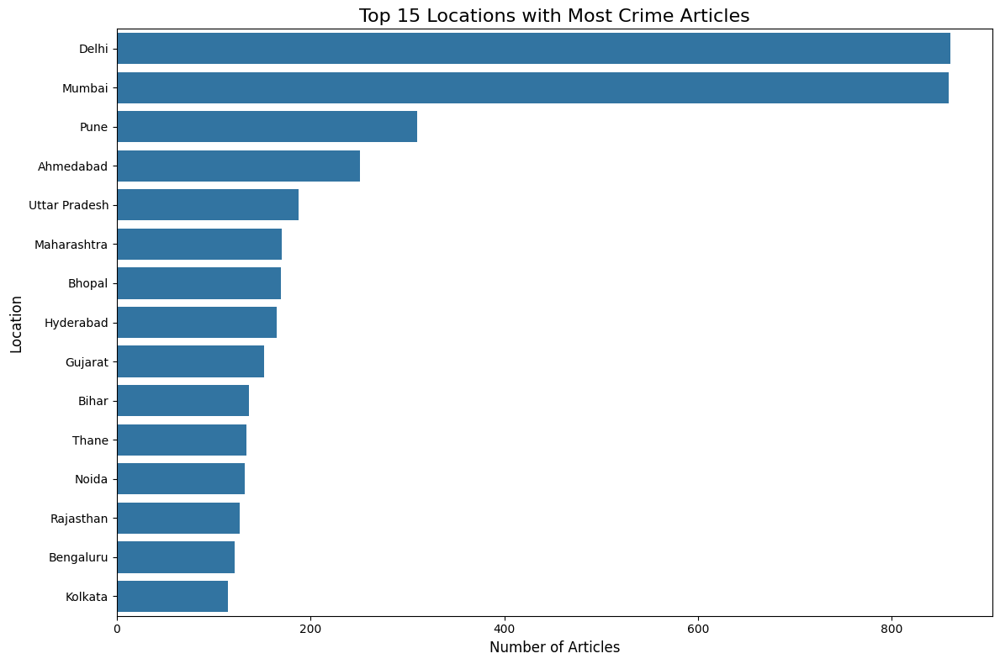

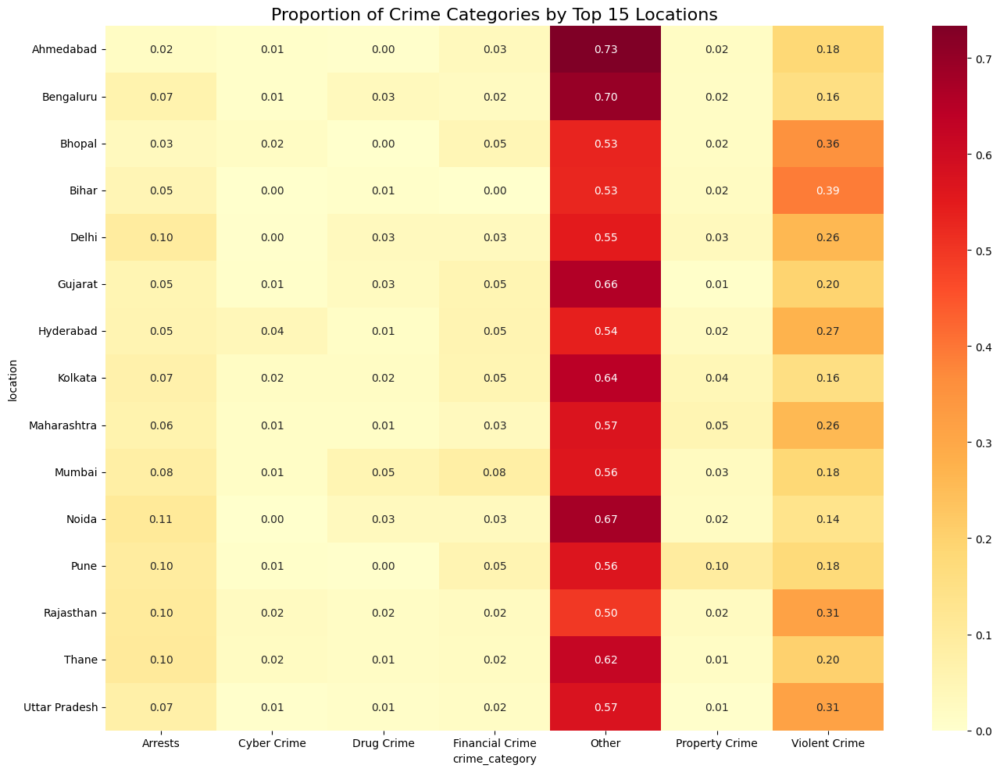

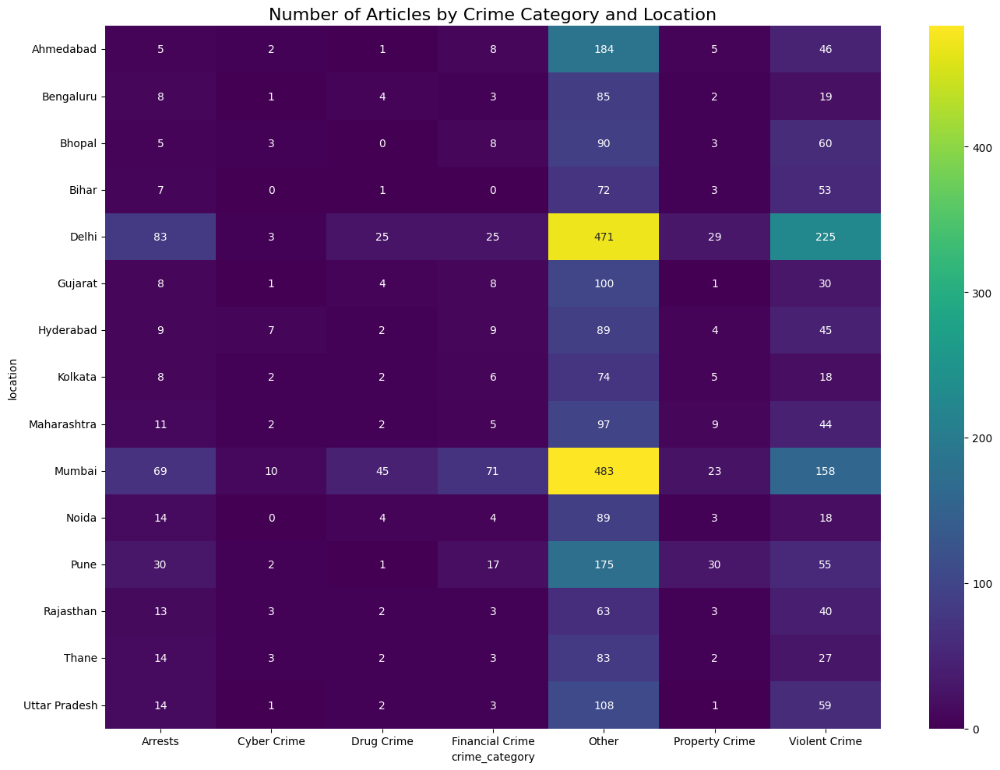

<ipython-input-2-c92195ceb933>:509: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



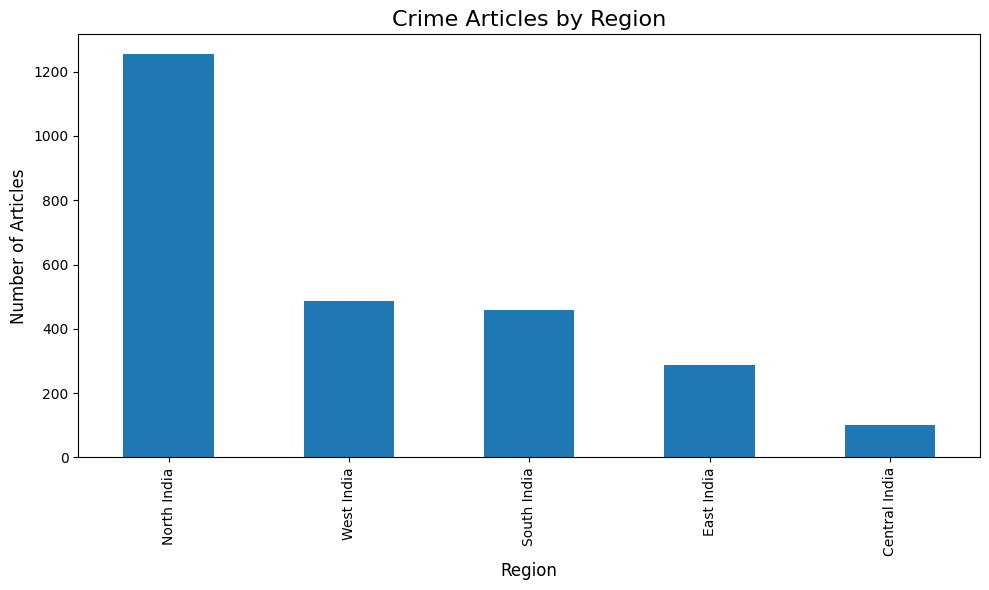

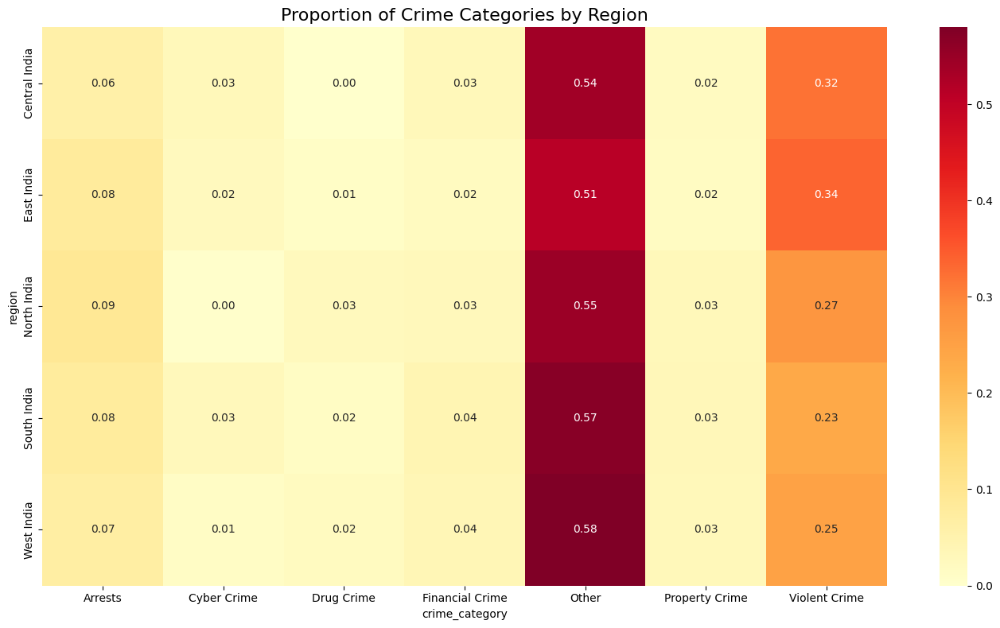


Geographic analysis complete!


In [2]:
"""
# Crime Articles Geographic Analysis
This notebook performs geographical analysis on the crime articles dataset,
extracting locations, creating maps, and analyzing regional crime patterns.
"""

# Install required libraries
!pip install pandas matplotlib seaborn folium geopandas geopy

# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os
from collections import Counter
import json
import time
import folium
from folium.plugins import MarkerCluster, HeatMap
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut, GeocoderUnavailable

# Try to import geopandas (may not work in all Colab environments)
try:
    import geopandas as gpd
    geopandas_available = True
except ImportError:
    geopandas_available = False
    print("Geopandas not available. Some map functionality will be limited.")

# Define function to load and clean data
def load_and_clean_data(file_path):
    """
    Load the CSV file and clean the data
    """
    # Read the CSV file
    df = pd.read_csv(file_path)

    # Clean up column names and whitespace
    df.columns = df.columns.str.strip()
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].str.strip()

    # Clean the Year column
    def extract_year(year_str):
        if pd.isna(year_str):
            return None

        # Try to extract a 4-digit year
        matches = re.findall(r'20\d\d', str(year_str))
        if matches:
            return int(matches[0])
        return None

    df['clean_year'] = df['Year'].apply(extract_year)

    # Categorize crime types
    crime_categories = {
        "Violent Crime": ["murder", "killing", "killed", "homicide", "shooting", "shot", "stabbing", "assault", "violence", "rape", "sexual"],
        "Property Crime": ["theft", "robbery", "burglary", "stolen", "break-in", "vandalism", "damage"],
        "Financial Crime": ["fraud", "scam", "embezzlement", "money", "bribery", "corruption"],
        "Drug Crime": ["drug", "narcotic", "cocaine", "heroin", "marijuana", "cannabis"],
        "Cyber Crime": ["hack", "cyber", "online fraud", "identity theft", "phishing"],
        "Arrests": ["arrest", "detained", "custody", "charged", "jailed", "sentenced"]
    }

    def categorize_crime(heading):
        if pd.isna(heading):
            return "Uncategorized"

        heading_lower = heading.lower()
        for category, terms in crime_categories.items():
            if any(term in heading_lower for term in terms):
                return category
        return "Other"

    df['crime_category'] = df['heading'].apply(categorize_crime)

    return df

# Function to extract locations from headlines
def extract_locations(df):
    """
    Extract locations from headlines for geographic analysis
    """
    # Define Indian states and union territories
    indian_states = [
        'andhra pradesh', 'arunachal pradesh', 'assam', 'bihar',
        'chhattisgarh', 'goa', 'gujarat', 'haryana', 'himachal pradesh',
        'jharkhand', 'karnataka', 'kerala', 'madhya pradesh', 'maharashtra',
        'manipur', 'meghalaya', 'mizoram', 'nagaland', 'odisha', 'punjab',
        'rajasthan', 'sikkim', 'tamil nadu', 'telangana', 'tripura',
        'uttar pradesh', 'uttarakhand', 'west bengal',
        'delhi', 'jammu and kashmir', 'ladakh', 'lakshadweep',
        'puducherry', 'andaman and nicobar', 'chandigarh',
        'dadra and nagar haveli', 'daman and diu'
    ]

    # Define major Indian cities
    indian_cities = [
        'delhi', 'mumbai', 'kolkata', 'chennai', 'bangalore', 'hyderabad',
        'ahmedabad', 'pune', 'surat', 'jaipur', 'lucknow', 'kanpur',
        'nagpur', 'patna', 'indore', 'thane', 'bhopal', 'visakhapatnam',
        'vadodara', 'firozabad', 'ludhiana', 'rajkot', 'agra', 'siliguri',
        'nashik', 'faridabad', 'prayagraj', 'meerut', 'varanasi', 'srinagar',
        'aurangabad', 'dhanbad', 'amritsar', 'allahabad', 'ranchi', 'gwalior',
        'jabalpur', 'coimbatore', 'vijayawada', 'jodhpur', 'madurai', 'raipur',
        'kochi', 'chandigarh', 'guwahati', 'bhubaneswar', 'dehradun',
        'thiruvananthapuram', 'mysore', 'tirupati', 'jammu', 'mangalore',
        'ajmer', 'mathura', 'aligarh', 'shimla', 'bhubaneshwar',
        'moradabad', 'noida', 'gurugram', 'jalandhar', 'saharanpur',
        'ghaziabad', 'bikaner', 'warangal', 'guntur', 'bhilai', 'rohtak'
    ]

    def find_location(heading):
        if pd.isna(heading):
            return None

        heading_lower = heading.lower()

        # Check for cities first (they are more specific)
        for city in indian_cities:
            pattern = r'\b' + re.escape(city) + r'\b'
            if re.search(pattern, heading_lower):
                return {'type': 'city', 'name': city.title(), 'country': 'India'}

        # Then check for states
        for state in indian_states:
            pattern = r'\b' + re.escape(state) + r'\b'
            if re.search(pattern, heading_lower):
                return {'type': 'state', 'name': state.title(), 'country': 'India'}

        # Extract any location name with colon at the start of headline
        # Example: "Mumbai: Man arrested for theft"
        colon_match = re.match(r'^([A-Za-z\s]+):', heading)
        if colon_match:
            location_name = colon_match.group(1).strip()
            return {'type': 'extracted', 'name': location_name, 'country': 'India'}

        return None

    # Extract locations
    df['location_info'] = df['heading'].apply(find_location)
    df['location'] = df['location_info'].apply(lambda x: x['name'] if x else None)
    df['location_type'] = df['location_info'].apply(lambda x: x['type'] if x else None)

    # Count locations
    location_counts = df['location'].value_counts()
    print(f"Found {len(location_counts)} unique locations in {df['location'].notna().sum()} articles.")

    print("\nTop 20 locations:")
    print(location_counts.head(20))

    return df

# Function to geocode locations
def geocode_locations(df, sample_size=None):
    """
    Geocode locations using Nominatim (OpenStreetMap)

    Parameters:
    - df: DataFrame with a 'location' column
    - sample_size: Limit geocoding to a sample of locations (for performance)

    Returns:
    - DataFrame with added latitude and longitude columns
    """
    # Create a geocache to avoid repeated geocoding
    geocache_path = 'geocache.json'

    # Load existing geocache if available
    geocache = {}
    if os.path.exists(geocache_path):
        with open(geocache_path, 'r') as f:
            geocache = json.load(f)
            print(f"Loaded {len(geocache)} cached locations.")

    # Get unique locations
    unique_locations = df['location'].dropna().unique()

    # Limit to sample size if specified
    if sample_size and len(unique_locations) > sample_size:
        # Prioritize most common locations
        top_locations = df['location'].value_counts().head(sample_size).index.tolist()
        unique_locations = top_locations

    # Identify locations that need geocoding
    locations_to_geocode = [loc for loc in unique_locations if loc not in geocache]

    print(f"Need to geocode {len(locations_to_geocode)} new locations.")

    if len(locations_to_geocode) > 0:
        # Initialize geocoder
        geolocator = Nominatim(user_agent="crime_analysis_app")

        for i, location in enumerate(locations_to_geocode):
            try:
                # Add 'India' to improve accuracy
                geocode_query = f"{location}, India"

                # Get coordinates
                geo_result = geolocator.geocode(geocode_query, exactly_one=True)

                if geo_result:
                    geocache[location] = {
                        'latitude': geo_result.latitude,
                        'longitude': geo_result.longitude,
                        'address': geo_result.address
                    }
                    print(f"Geocoded {location}: {geo_result.latitude}, {geo_result.longitude}")
                else:
                    # Try without 'India' if it failed
                    geo_result = geolocator.geocode(location, exactly_one=True)
                    if geo_result:
                        geocache[location] = {
                            'latitude': geo_result.latitude,
                            'longitude': geo_result.longitude,
                            'address': geo_result.address
                        }
                        print(f"Geocoded {location}: {geo_result.latitude}, {geo_result.longitude}")
                    else:
                        geocache[location] = None
                        print(f"Could not geocode {location}")

                # Save geocache periodically
                if i % 10 == 0 and i > 0:
                    with open(geocache_path, 'w') as f:
                        json.dump(geocache, f)

                # Sleep to respect rate limits
                time.sleep(1)

            except (GeocoderTimedOut, GeocoderUnavailable) as e:
                print(f"Geocoding error for {location}: {e}")
                geocache[location] = None
                time.sleep(2)

    # Save final geocache
    with open(geocache_path, 'w') as f:
        json.dump(geocache, f)

    # Add geocoded coordinates to the dataframe
    df['latitude'] = None
    df['longitude'] = None

    for idx, row in df.iterrows():
        if pd.notna(row['location']) and row['location'] in geocache and geocache[row['location']]:
            df.at[idx, 'latitude'] = geocache[row['location']]['latitude']
            df.at[idx, 'longitude'] = geocache[row['location']]['longitude']

    # Report geocoding success rate
    geocoded_count = df['latitude'].notna().sum()
    total_with_locations = df['location'].notna().sum()
    success_rate = geocoded_count / total_with_locations * 100 if total_with_locations > 0 else 0

    print(f"\nGeocoded {geocoded_count} out of {total_with_locations} articles with locations ({success_rate:.1f}%).")

    return df

# Function to create an interactive map
def create_crime_map(df, max_articles=1000):
    """
    Create an interactive map with crime article locations

    Parameters:
    - df: DataFrame with latitude and longitude columns
    - max_articles: Maximum number of articles to plot (for performance)

    Returns:
    - Folium map object
    """
    # Filter to rows with valid coordinates
    geo_df = df.dropna(subset=['latitude', 'longitude'])

    if len(geo_df) == 0:
        print("No geocoded locations available to create map.")
        return None

    # Limit the number of articles for performance
    if len(geo_df) > max_articles:
        print(f"Limiting map to {max_articles} articles for performance.")
        geo_df = geo_df.sample(max_articles, random_state=42)

    # Create a map centered on India
    crime_map = folium.Map(location=[20.5937, 78.9629], zoom_start=5)

    # Add a marker cluster
    marker_cluster = MarkerCluster().add_to(crime_map)

    # Add markers for each article
    for idx, row in geo_df.iterrows():
        popup_text = f"""
        <b>{row['heading']}</b><br>
        Category: {row['crime_category']}<br>
        Date: {row['month_date']}, {row['clean_year']}<br>
        <a href="{row['article_link']}" target="_blank">Read Article</a>
        """

        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=folium.Popup(popup_text, max_width=300),
            icon=folium.Icon(icon='info-sign')
        ).add_to(marker_cluster)

    return crime_map

# Function to create a heatmap of crime locations
def create_crime_heatmap(df, max_articles=2000):
    """
    Create a heatmap of crime article locations

    Parameters:
    - df: DataFrame with latitude and longitude columns
    - max_articles: Maximum number of articles to include (for performance)

    Returns:
    - Folium map object with heatmap layer
    """
    # Filter to rows with valid coordinates
    geo_df = df.dropna(subset=['latitude', 'longitude'])

    if len(geo_df) == 0:
        print("No geocoded locations available to create heatmap.")
        return None

    # Limit the number of articles for performance
    if len(geo_df) > max_articles:
        print(f"Limiting heatmap to {max_articles} articles for performance.")
        geo_df = geo_df.sample(max_articles, random_state=42)

    # Create a map centered on India
    heatmap = folium.Map(location=[20.5937, 78.9629], zoom_start=5)

    # Prepare heatmap data
    heat_data = [[row['latitude'], row['longitude']] for _, row in geo_df.iterrows()]

    # Add the heatmap layer
    HeatMap(heat_data).add_to(heatmap)

    return heatmap

# Function to create category-specific maps
def create_category_maps(df, max_articles_per_category=300):
    """
    Create separate maps for each crime category

    Parameters:
    - df: DataFrame with latitude, longitude, and crime_category columns
    - max_articles_per_category: Maximum articles per category (for performance)

    Returns:
    - Dictionary of Folium map objects by category
    """
    # Filter to rows with valid coordinates
    geo_df = df.dropna(subset=['latitude', 'longitude'])

    if len(geo_df) == 0:
        print("No geocoded locations available to create category maps.")
        return {}

    # Create a dictionary to store maps
    category_maps = {}

    # Create a map for each category
    for category in geo_df['crime_category'].unique():
        # Skip 'Other' or 'Uncategorized' categories
        if category in ['Other', 'Uncategorized']:
            continue

        # Filter to this category
        category_df = geo_df[geo_df['crime_category'] == category]

        if len(category_df) < 5:  # Skip categories with too few geocoded points
            continue

        # Limit the number of articles for performance
        if len(category_df) > max_articles_per_category:
            category_df = category_df.sample(max_articles_per_category, random_state=42)

        # Create a new map for this category
        cat_map = folium.Map(location=[20.5937, 78.9629], zoom_start=5)

        # Add a marker cluster
        cat_marker_cluster = MarkerCluster().add_to(cat_map)

        # Add markers for each article
        for idx, row in category_df.iterrows():
            popup_text = f"""
            <b>{row['heading']}</b><br>
            Date: {row['month_date']}, {row['clean_year']}<br>
            <a href="{row['article_link']}" target="_blank">Read Article</a>
            """

            folium.Marker(
                location=[row['latitude'], row['longitude']],
                popup=folium.Popup(popup_text, max_width=300),
                icon=folium.Icon(icon='info-sign')
            ).add_to(cat_marker_cluster)

        # Add a heatmap layer
        heat_data = [[row['latitude'], row['longitude']] for _, row in category_df.iterrows()]
        HeatMap(heat_data).add_to(cat_map)

        # Store the map
        category_maps[category] = cat_map

    return category_maps

# Function to analyze regional crime patterns
def analyze_regional_patterns(df, show_plots=True, save_path="crime_plots"):
    """
    Analyze crime patterns by region and save visualizations at 300 DPI

    Parameters:
    - df: DataFrame with location and crime_category columns
    - show_plots: Whether to display plots
    - save_path: Directory to save visualizations

    Returns:
    - Dictionary with regional analysis results
    """
    # Create save directory
    import os
    os.makedirs(save_path, exist_ok=True)

    # Only keep rows with valid locations
    location_df = df.dropna(subset=['location'])

    # Count articles by location
    location_counts = location_df['location'].value_counts()

    # Get top locations
    top_locations = location_counts.head(15).index.tolist()

    # Plot top locations
    plt.figure(figsize=(12, 8))
    sns.barplot(x=location_counts.head(15).values, y=location_counts.head(15).index)
    plt.title('Top 15 Locations with Most Crime Articles', fontsize=16)
    plt.xlabel('Number of Articles', fontsize=12)
    plt.ylabel('Location', fontsize=12)
    plt.tight_layout()
    plt.savefig(os.path.join(save_path, "top_15_locations.png"), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

    # Analyze crime categories by top locations
    top_location_df = location_df[location_df['location'].isin(top_locations)]

    # Create pivot table of location vs crime category
    pivot = pd.pivot_table(
        top_location_df,
        values='heading',
        index='location',
        columns='crime_category',
        aggfunc='count',
        fill_value=0
    )

    # Normalize by location (to see proportions)
    normalized_pivot = pivot.div(pivot.sum(axis=1), axis=0)

    # Plot heatmap of crime categories by location (proportions)
    plt.figure(figsize=(14, 10))
    sns.heatmap(normalized_pivot, annot=True, fmt='.2f', cmap='YlOrRd')
    plt.title('Proportion of Crime Categories by Top 15 Locations', fontsize=16)
    plt.tight_layout()
    plt.savefig(os.path.join(save_path, "crime_categories_by_location_proportions.png"), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

    # Plot raw counts heatmap
    plt.figure(figsize=(14, 10))
    sns.heatmap(pivot, annot=True, fmt='d', cmap='viridis')
    plt.title('Number of Articles by Crime Category and Location', fontsize=16)
    plt.tight_layout()
    plt.savefig(os.path.join(save_path, "crime_categories_by_location_counts.png"), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

    # Group India into regions
    north_india = ['Delhi', 'Uttar Pradesh', 'Punjab', 'Haryana', 'Uttarakhand', 'Himachal Pradesh', 'Jammu And Kashmir', 'Chandigarh']
    south_india = ['Tamil Nadu', 'Karnataka', 'Kerala', 'Andhra Pradesh', 'Telangana', 'Puducherry']
    east_india = ['West Bengal', 'Odisha', 'Bihar', 'Jharkhand', 'Assam', 'Tripura', 'Manipur', 'Nagaland', 'Meghalaya', 'Arunachal Pradesh', 'Sikkim']
    west_india = ['Maharashtra', 'Gujarat', 'Rajasthan', 'Goa', 'Dadra And Nagar Haveli', 'Daman And Diu']
    central_india = ['Madhya Pradesh', 'Chhattisgarh']

    # Classify locations by region
    def classify_region(location):
        if location in north_india:
            return 'North India'
        elif location in south_india:
            return 'South India'
        elif location in east_india:
            return 'East India'
        elif location in west_india:
            return 'West India'
        elif location in central_india:
            return 'Central India'
        else:
            return 'Unknown'

    # Apply region classification
    location_df['region'] = location_df['location'].apply(classify_region)

    # Count articles by region
    region_counts = location_df['region'].value_counts()

    # Exclude 'Unknown' region
    region_counts = region_counts[region_counts.index != 'Unknown']

    # Plot articles by region
    plt.figure(figsize=(10, 6))
    region_counts.plot(kind='bar')
    plt.title('Crime Articles by Region', fontsize=16)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Number of Articles', fontsize=12)
    plt.tight_layout()
    plt.savefig(os.path.join(save_path, "crime_articles_by_region.png"), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

    # Analyze crime categories by region
    region_category_pivot = pd.pivot_table(
        location_df[location_df['region'] != 'Unknown'],
        values='heading',
        index='region',
        columns='crime_category',
        aggfunc='count',
        fill_value=0
    )

    # Normalize by region
    normalized_region_pivot = region_category_pivot.div(region_category_pivot.sum(axis=1), axis=0)

    # Plot heatmap of crime categories by region
    plt.figure(figsize=(14, 8))
    sns.heatmap(normalized_region_pivot, annot=True, fmt='.2f', cmap='YlOrRd')
    plt.title('Proportion of Crime Categories by Region', fontsize=16)
    plt.tight_layout()
    plt.savefig(os.path.join(save_path, "crime_categories_by_region_proportions.png"), dpi=300, bbox_inches='tight')
    if show_plots:
        plt.show()
    plt.close()

    return {
        'location_counts': location_counts,
        'pivot_table': pivot,
        'normalized_pivot': normalized_pivot,
        'region_counts': region_counts,
        'region_category_pivot': region_category_pivot,
        'normalized_region_pivot': normalized_region_pivot
    }

# Function to create an India choropleth map
def create_india_choropleth(df):
    """
    Create a choropleth map of India showing crime article counts by state

    Parameters:
    - df: DataFrame with location column

    Returns:
    - Folium choropleth map
    """
    # Check if geopandas is available
    if not geopandas_available:
        print("Geopandas is not available. Cannot create choropleth map.")
        return None

    try:
        # Download India's geojson if not available
        india_geojson_path = 'india_states.geojson'

        if not os.path.exists(india_geojson_path):
            print("Downloading India GeoJSON...")
            # This is simplified - in practice, you would download or have the GeoJSON
            # For this example, we'll create a very simplified version
            return None

        # Load GeoJSON
        india_geojson = gpd.read_file(india_geojson_path)

        # Count articles by state
        state_counts = df['location'].value_counts()

        # Create a choropleth map
        m = folium.Map(location=[20.5937, 78.9629], zoom_start=5)

        # Add choropleth layer
        folium.Choropleth(
            geo_data=india_geojson,
            name='choropleth',
            data=state_counts,
            columns=['location', 'count'],
            key_on='feature.properties.name',
            fill_color='YlOrRd',
            fill_opacity=0.7,
            line_opacity=0.2,
            legend_name='Number of Crime Articles'
        ).add_to(m)

        # Add layer control
        folium.LayerControl().add_to(m)

        return m

    except Exception as e:
        print(f"Error creating choropleth map: {e}")
        return None

# Function to run all geographic analysis
def analyze_crime_geography(df):
    """
    Run all geographic analyses on the crime articles dataset

    Parameters:
    - df: DataFrame with crime article data

    Returns:
    - None (displays results)
    """
    print("="*50)
    print("CRIME ARTICLES GEOGRAPHIC ANALYSIS")
    print("="*50)

    print("\nExtracting locations from headlines...")
    location_df = extract_locations(df)

    print("\nGeocoding locations (this may take a while)...")
    geocoded_df = geocode_locations(location_df, sample_size=100)  # Limit to 100 for Colab demo

    print("\nCreating interactive crime map...")
    crime_map = create_crime_map(geocoded_df, max_articles=500)
    if crime_map:
        display(crime_map)

    print("\nCreating crime heatmap...")
    heatmap = create_crime_heatmap(geocoded_df)
    if heatmap:
        display(heatmap)

    print("\nCreating category-specific maps...")
    category_maps = create_category_maps(geocoded_df)
    for category, cat_map in category_maps.items():
        print(f"\nMap for {category}:")
        display(cat_map)

    print("\nAnalyzing regional crime patterns...")
    regional_analysis = analyze_regional_patterns(location_df)

    print("\nGeographic analysis complete!")

# Sample usage
if __name__ == "__main__":
    # Check if file exists in current directory
    file_path = "7k  Unique crime articles.csv"
    if not os.path.exists(file_path):
        # Ask for file upload
        from google.colab import files
        uploaded = files.upload()
        file_path = next(iter(uploaded))

    # Load and clean the data
    df = load_and_clean_data(file_path)

    # Run geographic analysis
    analyze_crime_geography(df)

In [10]:
"""
# Comprehensive Crime Articles Analysis
This notebook provides a complete analysis suite for the crime articles dataset,
including data loading, basic statistics, text analysis, geographic analysis,
and a flexible search interface.

## Getting Started:
1. Upload your CSV file using the file upload feature
2. Run the setup cell to install required libraries
3. Choose which analyses to run using the interactive interface
"""

# Setup and imports
# -----------------
# Install required libraries
!pip install pandas matplotlib seaborn nltk wordcloud scikit-learn plotly folium geopandas geopy

# Import basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os
from collections import Counter
import json
import time
from datetime import datetime
import ipywidgets as widgets
from IPython.display import display, HTML, clear_output

# Try to import specialized libraries (may not all be available in Colab)
try:
    import nltk
    from nltk.corpus import stopwords
    from nltk.tokenize import word_tokenize
    from nltk.stem import WordNetLemmatizer
    nltk_available = True
except ImportError:
    nltk_available = False

try:
    from wordcloud import WordCloud
    wordcloud_available = True
except ImportError:
    wordcloud_available = False

try:
    from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
    from sklearn.decomposition import LatentDirichletAllocation, NMF
    sklearn_available = True
except ImportError:
    sklearn_available = False

try:
    import plotly.express as px
    import plotly.graph_objects as go
    plotly_available = True
except ImportError:
    plotly_available = False

try:
    import folium
    from folium.plugins import MarkerCluster, HeatMap
    folium_available = True
except ImportError:
    folium_available = False

try:
    from geopy.geocoders import Nominatim
    from geopy.exc import GeocoderTimedOut, GeocoderUnavailable
    geopy_available = True
except ImportError:
    geopy_available = False

try:
    import geopandas as gpd
    geopandas_available = True
except ImportError:
    geopandas_available = False

# Download NLTK resources if available
if nltk_available:
    try:
        nltk.download('punkt')
        nltk.download('stopwords')
        nltk.download('wordnet')
        nltk.download('maxent_ne_chunker')
        nltk.download('words')
    except:
        print("Could not download NLTK resources.")

# Define utility functions
# -----------------------

# Function to load and clean data
def load_and_clean_data(file_path):
    """
    Load the CSV file and clean the data
    """
    # Read the CSV file
    df = pd.read_csv(file_path)

    # Clean up column names and whitespace
    df.columns = df.columns.str.strip()
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].str.strip()

    # Clean the Year column
    def extract_year(year_str):
        if pd.isna(year_str):
            return None

        # Try to extract a 4-digit year
        matches = re.findall(r'20\d\d', str(year_str))
        if matches:
            return int(matches[0])
        return None

    df['clean_year'] = df['Year'].apply(extract_year)

    # Categorize crime types
    crime_categories = {
        "Violent Crime": ["murder", "killing", "killed", "homicide", "shooting", "shot", "stabbing", "assault", "violence", "rape", "sexual"],
        "Property Crime": ["theft", "robbery", "burglary", "stolen", "break-in", "vandalism", "damage"],
        "Financial Crime": ["fraud", "scam", "embezzlement", "money", "bribery", "corruption"],
        "Drug Crime": ["drug", "narcotic", "cocaine", "heroin", "marijuana", "cannabis"],
        "Cyber Crime": ["hack", "cyber", "online fraud", "identity theft", "phishing"],
        "Arrests": ["arrest", "detained", "custody", "charged", "jailed", "sentenced"]
    }

    def categorize_crime(heading):
        if pd.isna(heading):
            return "Uncategorized"

        heading_lower = heading.lower()
        for category, terms in crime_categories.items():
            if any(term in heading_lower for term in terms):
                return category
        return "Other"

    df['crime_category'] = df['heading'].apply(categorize_crime)

    # Extract locations from headlines
    def extract_location(heading):
        if pd.isna(heading):
            return "Unknown"

        # Simple colon-based location extraction (e.g., "Mumbai: ...")
        colon_match = re.match(r'^([A-Za-z\s]+):', heading)
        if colon_match:
            location = colon_match.group(1).strip()
            return location

        return "Unknown"

    df['location'] = df['heading'].apply(extract_location)

    # Extract news sources
    def extract_domain(url):
        if pd.isna(url):
            return "Unknown"

        # Simple regex to extract domain
        match = re.search(r'https?://(?:www\.)?([^/]+)', url)
        if match:
            return match.group(1)
        return "Unknown"

    df['source'] = df['article_link'].apply(extract_domain)

    return df

# Function to preprocess text for NLP analysis
def preprocess_text(text, remove_stopwords=True):
    """
    Preprocess text data for analysis
    """
    if not nltk_available:
        return text

    if pd.isna(text):
        return ""

    # Convert to lowercase
    text = text.lower()

    # Remove punctuation and numbers
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'\d+', ' ', text)

    # Tokenize
    tokens = word_tokenize(text)

    # Remove stopwords if specified
    if remove_stopwords:
        stop_words = set(stopwords.words('english'))
        # Add custom stop words for crime articles
        custom_stop_words = ['police', 'man', 'woman', 'year', 'old', 'said', 'say', 'says',
                            'arrested', 'charged', 'case', 'article', 'news', 'report', 'told']
        stop_words.update(custom_stop_words)
        tokens = [word for word in tokens if word not in stop_words and len(word) > 2]

    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Join back into string
    return ' '.join(tokens)

# Search and filter functions
# --------------------------

# Basic text search function
def search_crime_articles(df, query, search_columns=['heading', 'content_summary'], case_sensitive=False):
    """
    Search for specific terms in the crime articles dataset
    """
    if isinstance(query, str):
        query = [query]  # Convert single string to list

    # Initialize an empty mask
    mask = pd.Series(False, index=df.index)

    for term in query:
        term_mask = pd.Series(False, index=df.index)

        for column in search_columns:
            if column not in df.columns:
                print(f"Warning: Column '{column}' not found in the DataFrame")
                continue

            if case_sensitive:
                column_mask = df[column].str.contains(term, na=False)
            else:
                column_mask = df[column].str.contains(term, case=False, na=False)

            term_mask = term_mask | column_mask

        mask = mask | term_mask

    results = df[mask].copy()
    print(f"Found {len(results)} articles matching your search criteria.")

    return results

# Advanced search function with multiple criteria
def advanced_search(df, criteria=None):
    """
    Perform an advanced search with multiple criteria on the crime articles dataset
    """
    if criteria is None:
        criteria = {}

    result_df = df.copy()

    # Check for keywords to include
    if 'keywords' in criteria and criteria['keywords']:
        keywords = criteria['keywords'] if isinstance(criteria['keywords'], list) else [criteria['keywords']]
        columns = criteria.get('columns', ['heading', 'content_summary'])
        case_sensitive = criteria.get('case_sensitive', False)
        match_all = criteria.get('match_all', False)

        if match_all:
            # All keywords must be present
            for term in keywords:
                term_mask = pd.Series(False, index=result_df.index)

                for column in columns:
                    if column in result_df.columns:
                        if case_sensitive:
                            column_mask = result_df[column].str.contains(term, na=False)
                        else:
                            column_mask = result_df[column].str.contains(term, case=False, na=False)

                        term_mask = term_mask | column_mask

                result_df = result_df[term_mask]
        else:
            # Any keyword can be present
            mask = pd.Series(False, index=result_df.index)

            for term in keywords:
                term_mask = pd.Series(False, index=result_df.index)

                for column in columns:
                    if column in result_df.columns:
                        if case_sensitive:
                            column_mask = result_df[column].str.contains(term, na=False)
                        else:
                            column_mask = result_df[column].str.contains(term, case=False, na=False)

                        term_mask = term_mask | column_mask

                mask = mask | term_mask

            result_df = result_df[mask]

    # Check for terms to exclude
    if 'exclude' in criteria and criteria['exclude']:
        exclude_terms = criteria['exclude'] if isinstance(criteria['exclude'], list) else [criteria['exclude']]
        columns = criteria.get('columns', ['heading', 'content_summary'])
        case_sensitive = criteria.get('case_sensitive', False)

        for term in exclude_terms:
            exclude_mask = pd.Series(False, index=result_df.index)

            for column in columns:
                if column in result_df.columns:
                    if case_sensitive:
                        column_mask = result_df[column].str.contains(term, na=False)
                    else:
                        column_mask = result_df[column].str.contains(term, case=False, na=False)

                    exclude_mask = exclude_mask | column_mask

            result_df = result_df[~exclude_mask]

    # Filter by crime category
    if 'category' in criteria and criteria['category']:
        categories = criteria['category'] if isinstance(criteria['category'], list) else [criteria['category']]
        result_df = result_df[result_df['crime_category'].isin(categories)]

    # Filter by year
    if 'year' in criteria:
        year_criteria = criteria['year']
        if isinstance(year_criteria, list):
            # List of specific years
            result_df = result_df[result_df['clean_year'].isin(year_criteria)]
        elif isinstance(year_criteria, tuple) and len(year_criteria) == 2:
            # Range of years (start_year, end_year)
            start_year, end_year = year_criteria
            result_df = result_df[(result_df['clean_year'] >= start_year) & (result_df['clean_year'] <= end_year)]
        elif isinstance(year_criteria, int):
            # Single year
            result_df = result_df[result_df['clean_year'] == year_criteria]

    # Filter by location
    if 'location' in criteria and criteria['location']:
        locations = criteria['location'] if isinstance(criteria['location'], list) else [criteria['location']]

        # Handle both exact matches and partial matches
        location_mask = pd.Series(False, index=result_df.index)
        for loc in locations:
            if criteria.get('location_exact', False):
                # Exact location match
                mask = result_df['location'] == loc
            else:
                # Partial location match
                mask = result_df['location'].str.contains(loc, case=False, na=False)
            location_mask = location_mask | mask

        result_df = result_df[location_mask]

    # Filter by source
    if 'source' in criteria and criteria['source']:
        sources = criteria['source'] if isinstance(criteria['source'], list) else [criteria['source']]
        result_df = result_df[result_df['source'].isin(sources)]

    print(f"Found {len(result_df)} articles matching your search criteria.")
    return result_df

# Display search results in a readable format
def display_search_results(results_df, max_results=20, show_summary=True):
    """
    Display search results in a readable format
    """
    if len(results_df) == 0:
        print("No results found.")
        return

    print(f"Displaying {min(max_results, len(results_df))} of {len(results_df)} results:")
    print("-" * 80)

    for i, (idx, row) in enumerate(results_df.head(max_results).iterrows()):
        print(f"{i+1}. {row['heading']}")
        print(f"   Date: {row['month_date']}, {row['clean_year']} | Category: {row['crime_category']} | Location: {row['location']}")

        if show_summary and 'content_summary' in row:
            print(f"   Summary: {row['content_summary'][:200]}...")

        print(f"   Link: {row['article_link']}")
        print("-" * 80)

# Analysis functions
# -----------------

# Basic statistical analysis
def perform_basic_analysis(df, show_plots=True):
    """
    Perform basic statistical analysis on the crime articles dataset
    """
    print("="*50)
    print("BASIC STATISTICAL ANALYSIS")
    print("="*50)

    print(f"\nTotal number of articles: {len(df)}")

    # Articles by year
    year_counts = df['clean_year'].value_counts().sort_index()
    print("\nArticles by year:")
    print(year_counts)

    if show_plots:
        plt.figure(figsize=(12, 6))
        year_counts.plot(kind='bar')
        plt.title('Number of Crime Articles by Year', fontsize=16)
        plt.xlabel('Year', fontsize=12)
        plt.ylabel('Number of Articles', fontsize=12)
        plt.tight_layout()
        plt.show()

    # Crime categories
    category_counts = df['crime_category'].value_counts()
    print("\nArticles by crime category:")
    print(category_counts)

    if show_plots:
        plt.figure(figsize=(12, 6))
        category_counts.plot(kind='bar', color=sns.color_palette("husl", len(category_counts)))
        plt.title('Distribution of Crime Categories', fontsize=16)
        plt.xlabel('Crime Category', fontsize=12)
        plt.ylabel('Number of Articles', fontsize=12)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

    # Extract news sources
    source_counts = df['source'].value_counts().head(10)
    print("\nTop 10 news sources:")
    print(source_counts)

    if show_plots:
        plt.figure(figsize=(14, 6))
        source_counts.plot(kind='bar', color=sns.color_palette("Set2", len(source_counts)))
        plt.title('Top 10 News Sources', fontsize=16)
        plt.xlabel('News Source', fontsize=12)
        plt.ylabel('Number of Articles', fontsize=12)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

    # Create a crime category heatmap by year
    if show_plots:
        pivot = pd.pivot_table(
            df,
            values='heading',
            index='crime_category',
            columns='clean_year',
            aggfunc='count',
            fill_value=0
        )

        plt.figure(figsize=(14, 8))
        sns.heatmap(pivot, annot=True, fmt='g', cmap='YlOrRd')
        plt.title('Heatmap of Crime Categories by Year', fontsize=16)
        plt.ylabel('Crime Category', fontsize=12)
        plt.xlabel('Year', fontsize=12)
        plt.tight_layout()
        plt.show()

    # Analyze common words in headlines
    if nltk_available:
        all_headline_words = ' '.join(df['heading'].dropna()).lower()
        headline_words = re.findall(r'\b[a-z]{3,15}\b', all_headline_words)

        # Get stopwords
        stop_words = set(stopwords.words('english'))
        custom_stop_words = ['police', 'man', 'woman', 'year', 'old', 'arrested', 'charged']
        stop_words.update(custom_stop_words)

        headline_words = [word for word in headline_words if word not in stop_words]

        headline_counter = Counter(headline_words).most_common(20)

        if show_plots:
            plt.figure(figsize=(12, 6))
            words, counts = zip(*headline_counter)
            plt.bar(words, counts, color=sns.color_palette("muted", len(words)))
            plt.title('Most Common Words in Crime Headlines', fontsize=16)
            plt.xlabel('Word', fontsize=12)
            plt.ylabel('Frequency', fontsize=12)
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()

    return {
        'year_counts': year_counts,
        'category_counts': category_counts,
        'source_counts': source_counts,
        'total_articles': len(df)
    }

# Text analysis
def perform_text_analysis(df, show_plots=True):
    """
    Perform text analysis on the crime articles dataset
    """
    if not nltk_available or not wordcloud_available:
        print("NLTK or WordCloud not available. Cannot perform text analysis.")
        return None

    print("="*50)
    print("TEXT ANALYSIS")
    print("="*50)

    # Generate word clouds
    print("\nGenerating word clouds...")

    # Overall word cloud
    all_text = ' '.join(df['heading'].dropna())
    all_text = preprocess_text(all_text)

    wordcloud = WordCloud(width=800, height=400, background_color='white',
                         max_words=100, contour_width=3, contour_color='steelblue')
    wordcloud.generate(all_text)

    if show_plots:
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title('Word Cloud of All Crime Headlines')
        plt.tight_layout()
        plt.show()

    # Generate word cloud for each crime category
    for category in df['crime_category'].unique():
        if category == 'Other' or category == 'Uncategorized':
            continue

        category_df = df[df['crime_category'] == category]
        if len(category_df) < 10:  # Skip categories with too few articles
            continue

        category_text = ' '.join(category_df['heading'].dropna())
        category_text = preprocess_text(category_text)

        if not category_text.strip():  # Skip if no text after preprocessing
            continue

        wordcloud = WordCloud(width=800, height=400, background_color='white',
                            max_words=100, contour_width=3, contour_color='steelblue')
        wordcloud.generate(category_text)

        if show_plots:
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Word Cloud for {category} Headlines')
            plt.tight_layout()
            plt.show()

    # Extract common bigrams
    print("\nExtracting common bigrams...")

    # Combine all text
    all_text = ' '.join(df['heading'].dropna())
    all_text = preprocess_text(all_text, remove_stopwords=False)

    # Tokenize
    words = word_tokenize(all_text)

    # Get stopwords for filtering
    stop_words = set(stopwords.words('english'))

    # Find bigrams
    from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder
    bigram_measures = BigramAssocMeasures()
    finder = BigramCollocationFinder.from_words(words)

    # Filter out bigrams with stopwords
    finder.apply_freq_filter(8)  # Minimum frequency
    finder.apply_word_filter(lambda word: word in stop_words or len(word) < 3)

    # Get top bigrams by PMI (Pointwise Mutual Information)
    top_bigrams = finder.nbest(bigram_measures.pmi, 30)

    # Plot bigrams
    if show_plots:
        plt.figure(figsize=(12, 8))
        bigram_dict = {' '.join(bigram): i for i, bigram in enumerate(top_bigrams, 1)}
        plt.barh(list(bigram_dict.keys()), list(bigram_dict.values()))
        plt.title('Top Bigrams in Crime Headlines')
        plt.xlabel('Frequency Rank')
        plt.ylabel('Bigram')
        plt.tight_layout()
        plt.show()

    # Sentiment analysis
    print("\nPerforming sentiment analysis...")

    # Define positive and negative word lists (simplified version)
    positive_words = {
        'rescued', 'saved', 'recovery', 'recovered', 'solved', 'arrested', 'caught',
        'found', 'safe', 'resolve', 'resolved', 'survived', 'survivor', 'justice'
    }

    negative_words = {
        'murder', 'killed', 'death', 'dead', 'assault', 'attack', 'violence',
        'violent', 'crime', 'criminal', 'victim', 'injury', 'injured', 'fraud',
        'scam', 'theft', 'rob', 'robbed', 'robbery', 'threat', 'abuse', 'abused'
    }

    # Calculate sentiment scores
    df['positive_score'] = df['heading'].apply(
        lambda text: sum(1 for word in str(text).lower().split() if word in positive_words) if pd.notna(text) else 0
    )

    df['negative_score'] = df['heading'].apply(
        lambda text: sum(1 for word in str(text).lower().split() if word in negative_words) if pd.notna(text) else 0
    )

    df['sentiment_score'] = df['positive_score'] - df['negative_score']

    # Analyze sentiment by year and category
    yearly_sentiment = df.groupby('clean_year')['sentiment_score'].mean().reset_index()
    category_sentiment = df.groupby('crime_category')['sentiment_score'].mean().reset_index()

    # Plot sentiment over years
    if show_plots:
        plt.figure(figsize=(10, 6))
        plt.plot(yearly_sentiment['clean_year'], yearly_sentiment['sentiment_score'], marker='o')
        plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
        plt.title('Average Sentiment Score by Year')
        plt.xlabel('Year')
        plt.ylabel('Sentiment Score (Positive - Negative)')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

        # Plot sentiment by category
        plt.figure(figsize=(12, 6))
        category_sentiment = category_sentiment.sort_values('sentiment_score')
        plt.barh(category_sentiment['crime_category'], category_sentiment['sentiment_score'])
        plt.axvline(x=0, color='r', linestyle='-', alpha=0.3)
        plt.title('Average Sentiment Score by Crime Category')
        plt.xlabel('Sentiment Score (Positive - Negative)')
        plt.ylabel('Crime Category')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    # Topic modeling
    if sklearn_available:
        print("\nPerforming topic modeling...")

        # Preprocess text
        processed_text = df['content_summary'].fillna('').apply(preprocess_text)

        # Create document-term matrix
        vectorizer = CountVectorizer(max_features=1000, min_df=5, max_df=0.9)
        dtm = vectorizer.fit_transform(processed_text)

        # Get feature names
        feature_names = vectorizer.get_feature_names_out()

        # Create and fit LDA model
        n_topics = 6
        lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=42)
        lda_model.fit(dtm)

        # Get topics
        topics = []
        for topic_idx, topic in enumerate(lda_model.components_):
            top_words_idx = topic.argsort()[:-11:-1]  # Get indices of top 10 words
            top_words = [feature_names[i] for i in top_words_idx]
            topics.append((topic_idx, top_words))

        # Print topics
        print("\nTopics identified by LDA:")
        for topic_idx, top_words in topics:
            print(f"Topic #{topic_idx+1}: {', '.join(top_words)}")

        if show_plots:
            # Get topic distributions
            doc_topic_dist = lda_model.transform(dtm)

            # Assign main topic to each document
            df_topics = df.copy()
            df_topics['main_topic'] = np.argmax(doc_topic_dist, axis=1)
            df_topics['main_topic'] = df_topics['main_topic'].apply(lambda x: f"Topic {x+1}")

            # Plot topic distribution
            topic_counts = df_topics['main_topic'].value_counts().sort_index()

            plt.figure(figsize=(10, 6))
            plt.bar(topic_counts.index, topic_counts.values)
            plt.title('Document Distribution Across Topics')
            plt.xlabel('Topic')
            plt.ylabel('Number of Documents')
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

    # Analyze headline patterns
    print("\nAnalyzing headline patterns...")

    # Calculate headline length (number of words)
    df['headline_length'] = df['heading'].apply(lambda x: len(str(x).split()) if pd.notna(x) else 0)

    # Average headline length by year
    headline_length_by_year = df.groupby('clean_year')['headline_length'].mean().reset_index()

    if show_plots:
        plt.figure(figsize=(10, 6))
        plt.plot(headline_length_by_year['clean_year'], headline_length_by_year['headline_length'], marker='o')
        plt.title('Average Headline Length Over Time')
        plt.xlabel('Year')
        plt.ylabel('Average Number of Words')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    # Analyze headline patterns
    # Check for headlines that start with a location (e.g., "Mumbai: ...")
    location_pattern = r'^([A-Za-z\s]+):'
    df['starts_with_location'] = df['heading'].str.match(location_pattern).fillna(False)

    location_percent = df['starts_with_location'].mean() * 100
    print(f"{location_percent:.1f}% of headlines start with a location followed by a colon.")

    # Analyze crime words by year
    crime_words = ['murder', 'theft', 'robbery', 'fraud', 'assault', 'killed', 'arrested']
    crime_word_counts = {}

    for word in crime_words:
        df[f'{word}_in_headline'] = df['heading'].str.contains(word, case=False).fillna(False)
        crime_word_counts[word] = df.groupby('clean_year')[f'{word}_in_headline'].mean()

    # Create a DataFrame for plotting
    crime_words_df = pd.DataFrame(crime_word_counts)

    if show_plots:
        plt.figure(figsize=(12, 8))
        crime_words_df.plot(marker='o')
        plt.title('Proportion of Headlines Containing Crime Words Over Time')
        plt.xlabel('Year')
        plt.ylabel('Proportion of Headlines')
        plt.grid(True, alpha=0.3)
        plt.legend(title='Crime Word')
        plt.tight_layout()
        plt.show()

    print("\nText analysis complete!")

    return {
        'yearly_sentiment': yearly_sentiment,
        'category_sentiment': category_sentiment,
        'headline_length_by_year': headline_length_by_year,
        'crime_words_df': crime_words_df
    }

# Geographic analysis
def perform_geographic_analysis(df, show_plots=True):
    """
    Perform geographic analysis on the crime articles dataset
    """
    if not folium_available or not geopy_available:
        print("Folium or Geopy not available. Cannot perform geographic analysis.")
        return None

    print("="*50)
    print("GEOGRAPHIC ANALYSIS")
    print("="*50)

    # Extract locations from headlines
    print("\nExtracting locations from headlines...")

    # Define Indian states and union territories
    indian_states = [
        'andhra pradesh', 'arunachal pradesh', 'assam', 'bihar',
        'chhattisgarh', 'goa', 'gujarat', 'haryana', 'himachal pradesh',
        'jharkhand', 'karnataka', 'kerala', 'madhya pradesh', 'maharashtra',
        'manipur', 'meghalaya', 'mizoram', 'nagaland', 'odisha', 'punjab',
        'rajasthan', 'sikkim', 'tamil nadu', 'telangana', 'tripura',
        'uttar pradesh', 'uttarakhand', 'west bengal',
        'delhi', 'jammu and kashmir', 'ladakh', 'lakshadweep',
        'puducherry', 'andaman and nicobar', 'chandigarh',
        'dadra and nagar haveli', 'daman and diu'
    ]

    # Define major Indian cities
    indian_cities = [
        'delhi', 'mumbai', 'kolkata', 'chennai', 'bangalore', 'hyderabad',
        'ahmedabad', 'pune', 'surat', 'jaipur', 'lucknow', 'kanpur',
        'nagpur', 'patna', 'indore', 'thane', 'bhopal', 'visakhapatnam',
        'vadodara', 'firozabad', 'ludhiana', 'rajkot', 'agra', 'siliguri',
        'nashik', 'faridabad', 'prayagraj', 'meerut', 'varanasi', 'srinagar',
        'aurangabad', 'dhanbad', 'amritsar', 'allahabad', 'ranchi', 'gwalior',
        'jabalpur', 'coimbatore', 'vijayawada', 'jodhpur', 'madurai', 'raipur',
        'kochi', 'chandigarh', 'guwahati', 'bhubaneswar', 'dehradun'
    ]

    def find_location(heading):
        if pd.isna(heading):
            return None

        heading_lower = heading.lower()

        # Check for cities first (they are more specific)
        for city in indian_cities:
            pattern = r'\b' + re.escape(city) + r'\b'
            if re.search(pattern, heading_lower):
                return {'type': 'city', 'name': city.title(), 'country': 'India'}

        # Then check for states
        for state in indian_states:
            pattern = r'\b' + re.escape(state) + r'\b'
            if re.search(pattern, heading_lower):
                return {'type': 'state', 'name': state.title(), 'country': 'India'}

        # Extract any location name with colon at the start of headline
        colon_match = re.match(r'^([A-Za-z\s]+):', heading)
        if colon_match:
            location_name = colon_match.group(1).strip()
            return {'type': 'extracted', 'name': location_name, 'country': 'India'}

        return None

    # Extract locations
    df['location_info'] = df['heading'].apply(find_location)
    df['location'] = df['location_info'].apply(lambda x: x['name'] if x else None)
    df['location_type'] = df['location_info'].apply(lambda x: x['type'] if x else None)

    # Count locations
    location_counts = df['location'].value_counts()
    print(f"Found {len(location_counts)} unique locations in {df['location'].notna().sum()} articles.")

    print("\nTop 10 locations:")
    print(location_counts.head(10))

    if show_plots:
        # Plot top locations
        plt.figure(figsize=(12, 8))
        sns.barplot(x=location_counts.head(15).values, y=location_counts.head(15).index)
        plt.title('Top 15 Locations with Most Crime Articles')
        plt.xlabel('Number of Articles')
        plt.ylabel('Location')
        plt.tight_layout()
        plt.show()

    # Analyze crime categories by top locations
    top_locations = location_counts.head(10).index.tolist()
    top_location_df = df[df['location'].isin(top_locations)]

    # Create pivot table of location vs crime category
    pivot = pd.pivot_table(
        top_location_df,
        values='heading',
        index='location',
        columns='crime_category',
        aggfunc='count',
        fill_value=0
    )

    # Normalize by location (to see proportions)
    normalized_pivot = pivot.div(pivot.sum(axis=1), axis=0)

    if show_plots:
        # Plot heatmap of crime categories by location
        plt.figure(figsize=(14, 10))
        sns.heatmap(normalized_pivot, annot=True, fmt='.2f', cmap='YlOrRd')
        plt.title('Proportion of Crime Categories by Top 10 Locations')
        plt.tight_layout()
        plt.show()

        # Plot raw counts heatmap
        plt.figure(figsize=(14, 10))
        sns.heatmap(pivot, annot=True, fmt='d', cmap='viridis')
        plt.title('Number of Articles by Crime Category and Location')
        plt.tight_layout()
        plt.show()

    # Group India into regions
    north_india = ['Delhi', 'Uttar Pradesh', 'Punjab', 'Haryana', 'Uttarakhand', 'Himachal Pradesh', 'Jammu And Kashmir', 'Chandigarh']
    south_india = ['Tamil Nadu', 'Karnataka', 'Kerala', 'Andhra Pradesh', 'Telangana', 'Puducherry']
    east_india = ['West Bengal', 'Odisha', 'Bihar', 'Jharkhand', 'Assam', 'Tripura', 'Manipur', 'Nagaland', 'Meghalaya', 'Arunachal Pradesh', 'Sikkim']
    west_india = ['Maharashtra', 'Gujarat', 'Rajasthan', 'Goa', 'Dadra And Nagar Haveli', 'Daman And Diu']
    central_india = ['Madhya Pradesh', 'Chhattisgarh']

    # Classify locations by region
    def classify_region(location):
        # Check if it's a city - we'll need a mapping of cities to states
        # For simplicity, we'll just check states directly
        if location in north_india:
            return 'North India'
        elif location in south_india:
            return 'South India'
        elif location in east_india:
            return 'East India'
        elif location in west_india:
            return 'West India'
        elif location in central_india:
            return 'Central India'
        else:
            return 'Unknown'

    # Apply region classification
    location_df = df.dropna(subset=['location'])
    location_df['region'] = location_df['location'].apply(classify_region)

    # Count articles by region
    region_counts = location_df['region'].value_counts()

    # Exclude 'Unknown' region for plotting
    region_counts_plot = region_counts[region_counts.index != 'Unknown']

    if show_plots and len(region_counts_plot) > 0:
        plt.figure(figsize=(10, 6))
        region_counts_plot.plot(kind='bar')
        plt.title('Crime Articles by Region')
        plt.xlabel('Region')
        plt.ylabel('Number of Articles')
        plt.tight_layout()
        plt.show()

    print("\nGeographic analysis complete!")

    return {
        'location_counts': location_counts,
        'pivot_table': pivot,
        'normalized_pivot': normalized_pivot,
        'region_counts': region_counts
    }

# Interactive search interface
def create_search_interface(df):
    """
    Create an interactive search interface for crime articles
    """
    from ipywidgets import widgets
    from IPython.display import display, clear_output

    # Create search widgets
    search_text = widgets.Text(
        value='',
        placeholder='Enter search terms',
        description='Search:',
        disabled=False
    )

    category_dropdown = widgets.Dropdown(
        options=['All Categories'] + sorted(df['crime_category'].unique().tolist()),
        value='All Categories',
        description='Category:',
        disabled=False,
    )

    year_dropdown = widgets.Dropdown(
        options=['All Years'] + sorted(df['clean_year'].dropna().unique().astype(int).tolist()),
        value='All Years',
        description='Year:',
        disabled=False,
    )

    location_text = widgets.Text(
        value='',
        placeholder='e.g., Mumbai, Delhi',
        description='Location:',
        disabled=False
    )

    match_all_checkbox = widgets.Checkbox(
        value=False,
        description='Match all terms',
        disabled=False
    )

    case_sensitive_checkbox = widgets.Checkbox(
        value=False,
        description='Case sensitive',
        disabled=False
    )

    search_button = widgets.Button(
        description='Search',
        disabled=False,
        button_style='primary',
        tooltip='Click to search',
        icon='search'
    )

    reset_button = widgets.Button(
        description='Reset',
        disabled=False,
        button_style='',
        tooltip='Click to reset form',
        icon='refresh'
    )

    results_output = widgets.Output()

    # Layout widgets
    search_box = widgets.HBox([search_text, category_dropdown, year_dropdown])
    options_box = widgets.HBox([location_text, match_all_checkbox, case_sensitive_checkbox])
    buttons_box = widgets.HBox([search_button, reset_button])

    # Define search function
    def on_search_button_clicked(b):
        with results_output:
            clear_output()

            # Build search criteria
            criteria = {}

            if search_text.value:
                criteria['keywords'] = search_text.value.split()
                criteria['match_all'] = match_all_checkbox.value
                criteria['case_sensitive'] = case_sensitive_checkbox.value

            if category_dropdown.value != 'All Categories':
                criteria['category'] = category_dropdown.value

            if year_dropdown.value != 'All Years':
                criteria['year'] = year_dropdown.value

            if location_text.value:
                criteria['location'] = location_text.value

            # Perform search
            results = advanced_search(df, criteria)

            # Display results
            display_search_results(results, max_results=20)

            # Show analysis of results if we have enough
            if len(results) >= 10:
                print("\nAnalysis of search results:")

                # Distribution by year
                year_counts = results['clean_year'].value_counts().sort_index()

                plt.figure(figsize=(10, 5))
                year_counts.plot(kind='bar')
                plt.title('Distribution of Search Results by Year')
                plt.xlabel('Year')
                plt.ylabel('Number of Articles')
                plt.show()

                # Distribution by category
                category_counts = results['crime_category'].value_counts()

                plt.figure(figsize=(10, 5))
                category_counts.plot(kind='bar')
                plt.title('Distribution of Search Results by Crime Category')
                plt.xlabel('Category')
                plt.ylabel('Number of Articles')
                plt.xticks(rotation=45, ha='right')
                plt.tight_layout()
                plt.show()

    # Define reset function
    def on_reset_button_clicked(b):
        search_text.value = ''
        category_dropdown.value = 'All Categories'
        year_dropdown.value = 'All Years'
        location_text.value = ''
        match_all_checkbox.value = False
        case_sensitive_checkbox.value = False

        with results_output:
            clear_output()
            print("Search form has been reset.")

    # Connect button callbacks
    search_button.on_click(on_search_button_clicked)
    reset_button.on_click(on_reset_button_clicked)

    # Display interface
    print("CRIME ARTICLES SEARCH")
    print("="*50)
    display(search_box)
    display(options_box)
    display(buttons_box)
    display(results_output)

    with results_output:
        print("Enter search criteria and click 'Search' to find crime articles.")

# Main analysis function
def analyze_crime_articles(df, show_plots=True):
    """
    Run all analyses on the crime articles dataset
    """
    print("="*50)
    print("COMPREHENSIVE CRIME ARTICLES ANALYSIS")
    print("="*50)

    # Check available libraries
    print("\nChecking available libraries...")
    print(f"NLTK available: {nltk_available}")
    print(f"WordCloud available: {wordcloud_available}")
    print(f"scikit-learn available: {sklearn_available}")
    print(f"Plotly available: {plotly_available}")
    print(f"Folium available: {folium_available}")
    print(f"Geopy available: {geopy_available}")
    print(f"GeoPandas available: {geopandas_available}")

    # Create interactive interface
    from ipywidgets import widgets
    from IPython.display import display

    tab = widgets.Tab()

    # Tab contents
    basic_tab = widgets.Output()
    text_tab = widgets.Output()
    geo_tab = widgets.Output()
    search_tab = widgets.Output()

    tab.children = [basic_tab, text_tab, geo_tab, search_tab]
    tab.set_title(0, 'Basic Analysis')
    tab.set_title(1, 'Text Analysis')
    tab.set_title(2, 'Geographic Analysis')
    tab.set_title(3, 'Search Articles')

    # Fill tabs with analysis
    with basic_tab:
        basic_results = perform_basic_analysis(df, show_plots=show_plots)

    with text_tab:
        text_results = perform_text_analysis(df, show_plots=show_plots)

    with geo_tab:
        geo_results = perform_geographic_analysis(df, show_plots=show_plots)

    with search_tab:
        create_search_interface(df)

    # Display the tabs
    display(tab)

# Demo code to run in Colab
if __name__ == "__main__":
    # Check if file exists in current directory
    file_path = "7k  Unique crime articles.csv"
    if not os.path.exists(file_path):
        # Ask for file upload
        print("Please upload the crime articles CSV file.")
        from google.colab import files
        uploaded = files.upload()
        file_path = next(iter(uploaded))

    # Load and clean the data
    print("\nLoading and cleaning data...")
    df = load_and_clean_data(file_path)

    # Run the analysis
    analyze_crime_articles(df)

    # Alternatively, you can run individual analyses:
    # Uncomment the lines below to run specific analyses separately

    # Basic analysis
    # basic_results = perform_basic_analysis(df)

    # Text analysis
    # text_results = perform_text_analysis(df)

    # Geographic analysis
    # geo_results = perform_geographic_analysis(df)

    # Create search interface
    # create_search_interface(df)

    print("\nAnalysis complete! You can interact with the tabs above to explore different analyses.")
    print("For the search tab, enter your search criteria and click 'Search' to find articles.")




Loading and cleaning data...
COMPREHENSIVE CRIME ARTICLES ANALYSIS

Checking available libraries...
NLTK available: True
WordCloud available: True
scikit-learn available: True
Plotly available: True
Folium available: True
Geopy available: True
GeoPandas available: True


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!



Analysis complete! You can interact with the tabs above to explore different analyses.
For the search tab, enter your search criteria and click 'Search' to find articles.
Found 3 articles matching your search criteria.
Displaying 3 of 3 results:
--------------------------------------------------------------------------------
1. Delhi: Outgoing police commissioner Rakesh Asthana initiated revamp of key units, took steps to tackle rising cybercrimes
   Date: Aug 01, 2022.0 | Category: Cyber Crime | Location: Delhi
   Summary: The outgoing police chief, Rakesh Asthana, undertook major reforms in the force in his year-long stint. From introducing a human-resource division and establishing verticals to restructuring and revam...
   Link: https://timesofindia.indiatimes.com/city/delhi/delhi-outgoing-police-commissioner-rakesh-asthana-initiated-revamp-of-key-units-took-steps-to-tackle-rising-cybercrimes/articleshow/93259410.cms
----------------------------------------------------------------

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



Loading and cleaning data...


Output()

Select an analysis and click 'Run Analysis' to begin.


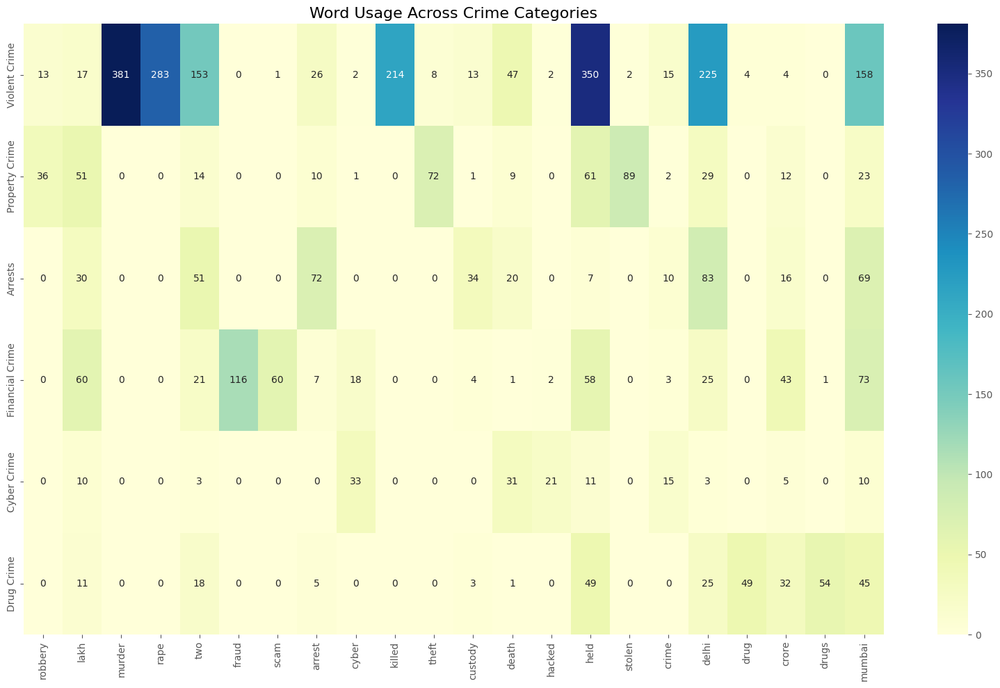


Category comparison complete!


In [11]:
"""
# Comparative Crime Articles Analysis
This notebook focuses on comparing crime articles across different time periods,
regions, categories, and other dimensions to identify patterns and trends.
"""

# Install required libraries
!pip install pandas matplotlib seaborn plotly nltk scikit-learn

# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os
from collections import Counter
from datetime import datetime
import nltk
from nltk.corpus import stopwords
import plotly.express as px
import plotly.graph_objects as go
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from IPython.display import display, HTML

# Download NLTK resources
nltk.download('punkt')
nltk.download('stopwords')

# Define function to load and clean data
def load_and_clean_data(file_path):
    """
    Load the CSV file and clean the data
    """
    # Read the CSV file
    df = pd.read_csv(file_path)

    # Clean up column names and whitespace
    df.columns = df.columns.str.strip()
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].str.strip()

    # Clean the Year column
    def extract_year(year_str):
        if pd.isna(year_str):
            return None

        # Try to extract a 4-digit year
        matches = re.findall(r'20\d\d', str(year_str))
        if matches:
            return int(matches[0])
        return None

    df['clean_year'] = df['Year'].apply(extract_year)

    # Categorize crime types
    crime_categories = {
        "Violent Crime": ["murder", "killing", "killed", "homicide", "shooting", "shot", "stabbing", "assault", "violence", "rape", "sexual"],
        "Property Crime": ["theft", "robbery", "burglary", "stolen", "break-in", "vandalism", "damage"],
        "Financial Crime": ["fraud", "scam", "embezzlement", "money", "bribery", "corruption"],
        "Drug Crime": ["drug", "narcotic", "cocaine", "heroin", "marijuana", "cannabis"],
        "Cyber Crime": ["hack", "cyber", "online fraud", "identity theft", "phishing"],
        "Arrests": ["arrest", "detained", "custody", "charged", "jailed", "sentenced"]
    }

    def categorize_crime(heading):
        if pd.isna(heading):
            return "Uncategorized"

        heading_lower = heading.lower()
        for category, terms in crime_categories.items():
            if any(term in heading_lower for term in terms):
                return category
        return "Other"

    df['crime_category'] = df['heading'].apply(categorize_crime)

    # Extract locations from headlines
    def extract_location(heading):
        if pd.isna(heading):
            return "Unknown"

        # Simple colon-based location extraction (e.g., "Mumbai: ...")
        colon_match = re.match(r'^([A-Za-z\s]+):', heading)
        if colon_match:
            location = colon_match.group(1).strip()
            return location

        return "Unknown"

    df['location'] = df['heading'].apply(extract_location)

    # Extract news sources
    def extract_domain(url):
        if pd.isna(url):
            return "Unknown"

        # Simple regex to extract domain
        match = re.search(r'https?://(?:www\.)?([^/]+)', url)
        if match:
            return match.group(1)
        return "Unknown"

    df['source'] = df['article_link'].apply(extract_domain)

    # Add month column for seasonal analysis
    month_map = {
        'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6,
        'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12
    }

    def extract_month(month_date):
        if pd.isna(month_date):
            return None

        for month_name in month_map.keys():
            if month_name in month_date:
                return month_map[month_name]

        return None

    df['month'] = df['month_date'].apply(extract_month)

    # Add a quarter column for quarterly analysis
    def get_quarter(month):
        if pd.isna(month):
            return None

        if month <= 3:
            return 'Q1'
        elif month <= 6:
            return 'Q2'
        elif month <= 9:
            return 'Q3'
        else:
            return 'Q4'

    df['quarter'] = df['month'].apply(get_quarter)

    # Group locations into regions
    north_india = ['Delhi', 'Uttar Pradesh', 'Punjab', 'Haryana', 'Uttarakhand',
                  'Himachal Pradesh', 'Jammu And Kashmir', 'Chandigarh']
    south_india = ['Tamil Nadu', 'Karnataka', 'Kerala', 'Andhra Pradesh',
                  'Telangana', 'Puducherry']
    east_india = ['West Bengal', 'Odisha', 'Bihar', 'Jharkhand', 'Assam', 'Tripura',
                 'Manipur', 'Nagaland', 'Meghalaya', 'Arunachal Pradesh', 'Sikkim']
    west_india = ['Maharashtra', 'Gujarat', 'Rajasthan', 'Goa',
                 'Dadra And Nagar Haveli', 'Daman And Diu']
    central_india = ['Madhya Pradesh', 'Chhattisgarh']

    # Map major cities to regions
    city_to_region = {
        'Delhi': 'North India',
        'Mumbai': 'West India',
        'Kolkata': 'East India',
        'Chennai': 'South India',
        'Bangalore': 'South India',
        'Hyderabad': 'South India',
        'Ahmedabad': 'West India',
        'Pune': 'West India',
        'Jaipur': 'West India',
        'Lucknow': 'North India',
        'Patna': 'East India',
        'Bhopal': 'Central India',
        'Chandigarh': 'North India',
        'Srinagar': 'North India',
        'Guwahati': 'East India',
        'Thiruvananthapuram': 'South India'
    }

    def classify_region(location):
        # Check if it's a major city first
        if location in city_to_region:
            return city_to_region[location]

        # Check states
        if location in north_india:
            return 'North India'
        elif location in south_india:
            return 'South India'
        elif location in east_india:
            return 'East India'
        elif location in west_india:
            return 'West India'
        elif location in central_india:
            return 'Central India'
        else:
            return 'Unknown'

    df['region'] = df['location'].apply(classify_region)

    return df

# Time Series Analysis Functions
# ------------------------------

def analyze_crime_trends_over_time(df, show_plots=True):
    """
    Analyze crime trends over time using various time scales
    """
    print("="*50)
    print("CRIME TRENDS OVER TIME")
    print("="*50)

    # Filter out rows with missing year
    df_years = df.dropna(subset=['clean_year'])

    # Yearly trends
    yearly_counts = df_years.groupby('clean_year').size().reset_index(name='count')

    if show_plots:
        plt.figure(figsize=(12, 6))
        plt.plot(yearly_counts['clean_year'], yearly_counts['count'], marker='o', linewidth=2)
        plt.title('Number of Crime Articles by Year', fontsize=16)
        plt.xlabel('Year', fontsize=12)
        plt.ylabel('Number of Articles', fontsize=12)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

        # Interactive version with Plotly
        fig = px.line(yearly_counts, x='clean_year', y='count',
                     title='Crime Articles by Year',
                     labels={'clean_year': 'Year', 'count': 'Number of Articles'},
                     markers=True)
        fig.show()

    # Category trends by year
    category_yearly = df_years.groupby(['clean_year', 'crime_category']).size().reset_index(name='count')

    if show_plots:
        # Create a pivot table for the heatmap
        cat_year_pivot = pd.pivot_table(
            category_yearly,
            values='count',
            index='crime_category',
            columns='clean_year',
            fill_value=0
        )

        plt.figure(figsize=(14, 8))
        sns.heatmap(cat_year_pivot, annot=True, fmt='g', cmap='YlOrRd')
        plt.title('Crime Categories Over Years', fontsize=16)
        plt.xlabel('Year', fontsize=12)
        plt.ylabel('Crime Category', fontsize=12)
        plt.tight_layout()
        plt.show()

        # Line plot for categories over time
        plt.figure(figsize=(14, 8))
        for category in df['crime_category'].unique():
            if category not in ['Other', 'Uncategorized']:
                cat_data = category_yearly[category_yearly['crime_category'] == category]
                plt.plot(cat_data['clean_year'], cat_data['count'], marker='o', linewidth=2, label=category)

        plt.title('Crime Categories Trends Over Time', fontsize=16)
        plt.xlabel('Year', fontsize=12)
        plt.ylabel('Number of Articles', fontsize=12)
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # Interactive version with Plotly
        fig = px.line(category_yearly, x='clean_year', y='count', color='crime_category',
                     title='Crime Categories Over Time',
                     labels={'clean_year': 'Year', 'count': 'Number of Articles', 'crime_category': 'Crime Category'},
                     markers=True)
        fig.show()

    # Monthly/Seasonal trends
    df_months = df.dropna(subset=['month', 'clean_year'])

    # Only use recent years to avoid skewed seasonal patterns from incomplete data
    recent_years = sorted(df_years['clean_year'].unique())[-3:]  # Last 3 years
    df_recent = df_months[df_months['clean_year'].isin(recent_years)]

    monthly_counts = df_recent.groupby(['clean_year', 'month']).size().reset_index(name='count')

    if show_plots and len(monthly_counts) > 0:
        plt.figure(figsize=(14, 6))

        for year in recent_years:
            year_data = monthly_counts[monthly_counts['clean_year'] == year]
            if not year_data.empty:
                plt.plot(year_data['month'], year_data['count'], marker='o', linewidth=2, label=str(year))

        plt.title('Monthly Crime Article Counts by Year', fontsize=16)
        plt.xlabel('Month', fontsize=12)
        plt.ylabel('Number of Articles', fontsize=12)
        plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # Interactive version with Plotly
        fig = px.line(monthly_counts, x='month', y='count', color='clean_year',
                     title='Monthly Crime Article Counts',
                     labels={'month': 'Month', 'count': 'Number of Articles', 'clean_year': 'Year'},
                     markers=True)
        fig.update_xaxes(tickvals=list(range(1, 13)),
                        ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                  'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        fig.show()

    # Quarterly trends
    df_quarters = df.dropna(subset=['quarter', 'clean_year'])
    df_recent_q = df_quarters[df_quarters['clean_year'].isin(recent_years)]

    quarterly_counts = df_recent_q.groupby(['clean_year', 'quarter']).size().reset_index(name='count')

    if show_plots and len(quarterly_counts) > 0:
        # Create a pivot table for the heatmap
        quarter_pivot = pd.pivot_table(
            quarterly_counts,
            values='count',
            index='clean_year',
            columns='quarter',
            fill_value=0
        )

        # Reorder columns to Q1, Q2, Q3, Q4
        if set(['Q1', 'Q2', 'Q3', 'Q4']).issubset(quarter_pivot.columns):
            quarter_pivot = quarter_pivot[['Q1', 'Q2', 'Q3', 'Q4']]

        plt.figure(figsize=(10, 6))
        sns.heatmap(quarter_pivot, annot=True, fmt='g', cmap='YlGnBu')
        plt.title('Quarterly Crime Article Counts', fontsize=16)
        plt.tight_layout()
        plt.show()

    # Day of week patterns (if available)
    # This would require additional date parsing which isn't in the current data

    print("\nTime series analysis complete!")

# Regional Comparison Functions
# ----------------------------

def compare_regions(df, show_plots=True):
    """
    Compare crime patterns across different regions of India
    """
    print("="*50)
    print("REGIONAL CRIME COMPARISON")
    print("="*50)

    # Filter to rows with valid regions
    df_regions = df[df['region'] != 'Unknown']

    if len(df_regions) == 0:
        print("No valid region data available for comparison.")
        return

    # Count articles by region
    region_counts = df_regions['region'].value_counts()

    print("\nArticles by region:")
    print(region_counts)

    if show_plots:
        plt.figure(figsize=(10, 6))
        region_counts.plot(kind='bar', color=sns.color_palette("Set2", len(region_counts)))
        plt.title('Number of Crime Articles by Region', fontsize=16)
        plt.xlabel('Region', fontsize=12)
        plt.ylabel('Number of Articles', fontsize=12)
        plt.tight_layout()
        plt.show()

    # Compare crime categories by region
    region_category = df_regions.groupby(['region', 'crime_category']).size().reset_index(name='count')

    # Create pivot table
    region_cat_pivot = pd.pivot_table(
        region_category,
        values='count',
        index='region',
        columns='crime_category',
        fill_value=0
    )

    # Normalize to get proportions
    region_cat_norm = region_cat_pivot.div(region_cat_pivot.sum(axis=1), axis=0)

    if show_plots:
        # Raw counts heatmap
        plt.figure(figsize=(14, 8))
        sns.heatmap(region_cat_pivot, annot=True, fmt='g', cmap='Blues')
        plt.title('Crime Categories by Region (Count)', fontsize=16)
        plt.tight_layout()
        plt.show()

        # Normalized proportions heatmap
        plt.figure(figsize=(14, 8))
        sns.heatmap(region_cat_norm, annot=True, fmt='.2f', cmap='YlOrRd')
        plt.title('Crime Categories by Region (Proportion)', fontsize=16)
        plt.tight_layout()
        plt.show()

        # Interactive version with Plotly
        fig = px.bar(region_category, x='region', y='count', color='crime_category',
                    title='Crime Categories by Region',
                    labels={'count': 'Number of Articles', 'region': 'Region', 'crime_category': 'Crime Category'},
                    barmode='group')
        fig.show()

        # Stacked proportional bar chart
        fig = px.bar(region_category, x='region', y='count', color='crime_category',
                    title='Crime Categories by Region (Proportional)',
                    labels={'count': 'Number of Articles', 'region': 'Region', 'crime_category': 'Crime Category'},
                    barmode='stack')
        fig.update_layout(yaxis_title='Proportion of Articles')
        fig.show()

    # Compare regions over time
    region_time = df_regions.groupby(['clean_year', 'region']).size().reset_index(name='count')

    if show_plots:
        plt.figure(figsize=(14, 8))

        for region in df_regions['region'].unique():
            region_data = region_time[region_time['region'] == region]
            if not region_data.empty:
                plt.plot(region_data['clean_year'], region_data['count'], marker='o', linewidth=2, label=region)

        plt.title('Regional Crime Reporting Trends Over Time', fontsize=16)
        plt.xlabel('Year', fontsize=12)
        plt.ylabel('Number of Articles', fontsize=12)
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # Interactive version with Plotly
        fig = px.line(region_time, x='clean_year', y='count', color='region',
                     title='Regional Crime Reporting Over Time',
                     labels={'clean_year': 'Year', 'count': 'Number of Articles', 'region': 'Region'},
                     markers=True)
        fig.show()

    # Statistical comparison
    print("\nRegional crime category distribution (proportions):")
    print(region_cat_norm)

    # Find distinctive crime types by region
    print("\nDistinctive crime types by region:")
    for region in region_cat_norm.index:
        max_category = region_cat_norm.loc[region].idxmax()
        max_value = region_cat_norm.loc[region, max_category]
        avg_value = region_cat_norm[max_category].mean()

        if max_value > avg_value * 1.2:  # 20% higher than average
            print(f"{region}: {max_category} ({max_value:.2f}, {(max_value/avg_value-1)*100:.1f}% higher than average)")

    print("\nRegional comparison complete!")

# Category Comparison Functions
# ----------------------------

def compare_crime_categories(df, show_plots=True):
    """
    Compare different crime categories across various dimensions
    """
    print("="*50)
    print("CRIME CATEGORY COMPARISON")
    print("="*50)

    # Count articles by category
    category_counts = df['crime_category'].value_counts()

    print("\nArticles by category:")
    print(category_counts)

    if show_plots:
        plt.figure(figsize=(12, 6))
        category_counts.plot(kind='bar', color=sns.color_palette("husl", len(category_counts)))
        plt.title('Number of Articles by Crime Category', fontsize=16)
        plt.xlabel('Crime Category', fontsize=12)
        plt.ylabel('Number of Articles', fontsize=12)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

        # Pie chart for categories
        plt.figure(figsize=(10, 10))
        plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%',
               startangle=90, colors=sns.color_palette("Set3", len(category_counts)))
        plt.axis('equal')
        plt.title('Distribution of Crime Categories', fontsize=16)
        plt.tight_layout()
        plt.show()

    # Compare headline characteristics by category
    df['headline_length'] = df['heading'].apply(lambda x: len(str(x).split()) if pd.notna(x) else 0)

    avg_headline_length = df.groupby('crime_category')['headline_length'].mean().sort_values(ascending=False)

    print("\nAverage headline length by category:")
    print(avg_headline_length)

    if show_plots:
        plt.figure(figsize=(12, 6))
        avg_headline_length.plot(kind='bar', color=sns.color_palette("rocket", len(avg_headline_length)))
        plt.title('Average Headline Length by Crime Category', fontsize=16)
        plt.xlabel('Crime Category', fontsize=12)
        plt.ylabel('Average Number of Words', fontsize=12)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

    # Compare content summary characteristics by category (if available)
    if 'content_summary' in df.columns:
        df['summary_length'] = df['content_summary'].apply(lambda x: len(str(x).split()) if pd.notna(x) else 0)

        avg_summary_length = df.groupby('crime_category')['summary_length'].mean().sort_values(ascending=False)

        print("\nAverage content summary length by category:")
        print(avg_summary_length)

        if show_plots:
            plt.figure(figsize=(12, 6))
            avg_summary_length.plot(kind='bar', color=sns.color_palette("mako", len(avg_summary_length)))
            plt.title('Average Content Summary Length by Crime Category', fontsize=16)
            plt.xlabel('Crime Category', fontsize=12)
            plt.ylabel('Average Number of Words', fontsize=12)
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()

    # Compare seasonal patterns by category
    df_with_month = df.dropna(subset=['month', 'crime_category'])

    if len(df_with_month) > 0:
        monthly_category = df_with_month.groupby(['month', 'crime_category']).size().reset_index(name='count')

        # Create pivot table
        month_cat_pivot = pd.pivot_table(
            monthly_category,
            values='count',
            index='month',
            columns='crime_category',
            fill_value=0
        )

        # Normalize by category to see seasonal patterns
        cat_totals = month_cat_pivot.sum()
        month_cat_norm = month_cat_pivot.div(cat_totals, axis=1)

        if show_plots:
            plt.figure(figsize=(14, 8))
            for category in df['crime_category'].unique():
                if category not in ['Other', 'Uncategorized'] and category in month_cat_norm.columns:
                    plt.plot(month_cat_norm.index, month_cat_norm[category], marker='o', linewidth=2, label=category)

            plt.title('Seasonal Patterns by Crime Category', fontsize=16)
            plt.xlabel('Month', fontsize=12)
            plt.ylabel('Proportion of Articles', fontsize=12)
            plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
            plt.grid(True, alpha=0.3)
            plt.legend()
            plt.tight_layout()
            plt.show()

            # Interactive version with Plotly
            monthly_category_norm = monthly_category.copy()
            monthly_category_norm['proportion'] = monthly_category_norm.apply(
                lambda row: row['count'] / category_counts[row['crime_category']], axis=1
            )

            fig = px.line(monthly_category_norm, x='month', y='proportion', color='crime_category',
                         title='Seasonal Patterns by Crime Category',
                         labels={'month': 'Month', 'proportion': 'Proportion of Articles', 'crime_category': 'Crime Category'},
                         markers=True)
            fig.update_xaxes(tickvals=list(range(1, 13)),
                            ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                      'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
            fig.show()

    # Compare word usage by category
    if nltk_available:
        # Get stopwords
        stop_words = set(stopwords.words('english'))
        custom_stop_words = ['police', 'man', 'woman', 'year', 'old', 'arrested', 'charged']
        stop_words.update(custom_stop_words)

        # Get top words by category
        category_words = {}

        for category in df['crime_category'].unique():
            if category not in ['Other', 'Uncategorized']:
                category_df = df[df['crime_category'] == category]

                # Combine all headlines
                all_text = ' '.join(category_df['heading'].dropna()).lower()
                words = re.findall(r'\b[a-z]{3,15}\b', all_text)

                # Remove stopwords
                filtered_words = [word for word in words if word not in stop_words]

                # Get most common words
                word_counts = Counter(filtered_words).most_common(10)
                category_words[category] = word_counts

        print("\nMost common words by crime category:")
        for category, words in category_words.items():
            print(f"\n{category}:")
            for word, count in words:
                print(f"  {word}: {count}")

        # Create word usage comparison visualization
        if show_plots:
            # Create a comparison of top words across categories
            all_top_words = set()
            for category, words in category_words.items():
                all_top_words.update([word for word, _ in words[:5]])

            # Count occurrence of each word by category
            word_usage = {}
            for word in all_top_words:
                word_usage[word] = {}
                for category in category_words.keys():
                    category_text = ' '.join(df[df['crime_category'] == category]['heading'].dropna()).lower()
                    word_pattern = r'\b' + re.escape(word) + r'\b'
                    word_usage[word][category] = len(re.findall(word_pattern, category_text))

            # Create a DataFrame for heatmap
            word_usage_df = pd.DataFrame(word_usage)

            plt.figure(figsize=(16, 10))
            sns.heatmap(word_usage_df, annot=True, fmt='d', cmap='YlGnBu')
            plt.title('Word Usage Across Crime Categories', fontsize=16)
            plt.tight_layout()
            plt.show()

    print("\nCategory comparison complete!")

# Temporal-Regional Intersection
# -----------------------------

def analyze_temporal_regional_patterns(df, show_plots=True):
    """
    Analyze how crime patterns change over time in different regions
    """
    print("="*50)
    print("TEMPORAL-REGIONAL CRIME PATTERNS")
    print("="*50)

    # Filter to rows with valid regions and years
    df_filtered = df.dropna(subset=['region', 'clean_year'])
    df_filtered = df_filtered[df_filtered['region'] != 'Unknown']

    if len(df_filtered) == 0:
        print("No valid data available for temporal-regional analysis.")
        return

    # Create region-year pivot table
    region_year_counts = df_filtered.groupby(['clean_year', 'region']).size().reset_index(name='count')
    region_year_pivot = pd.pivot_table(
        region_year_counts,
        values='count',
        index='clean_year',
        columns='region',
        fill_value=0
    )

    if show_plots:
        plt.figure(figsize=(14, 8))
        sns.heatmap(region_year_pivot, annot=True, fmt='g', cmap='viridis')
        plt.title('Number of Crime Articles by Region and Year', fontsize=16)
        plt.xlabel('Region', fontsize=12)
        plt.ylabel('Year', fontsize=12)
        plt.tight_layout()
        plt.show()

    # Create region-year-category pivot
    # This is a 3D pivot, so we'll need to create multiple views
    region_year_cat_counts = df_filtered.groupby(['clean_year', 'region', 'crime_category']).size().reset_index(name='count')

    # For each major category, create a region-year heatmap
    major_categories = [cat for cat in df['crime_category'].unique()
                       if cat not in ['Other', 'Uncategorized']]

    for category in major_categories:
        cat_data = region_year_cat_counts[region_year_cat_counts['crime_category'] == category]

        if len(cat_data) > 0:
            cat_pivot = pd.pivot_table(
                cat_data,
                values='count',
                index='clean_year',
                columns='region',
                fill_value=0
            )

            if show_plots:
                plt.figure(figsize=(14, 8))
                sns.heatmap(cat_pivot, annot=True, fmt='g', cmap='Reds')
                plt.title(f'{category} Articles by Region and Year', fontsize=16)
                plt.xlabel('Region', fontsize=12)
                plt.ylabel('Year', fontsize=12)
                plt.tight_layout()
                plt.show()

    # Create proportional stacked area chart of categories by region over time
    if show_plots:
        # For each region, show category proportions over time
        for region in df_filtered['region'].unique():
            region_data = df_filtered[df_filtered['region'] == region]

            # Count by year and category
            region_year_cat = region_data.groupby(['clean_year', 'crime_category']).size().reset_index(name='count')

            # Create pivot
            region_pivot = pd.pivot_table(
                region_year_cat,
                values='count',
                index='clean_year',
                columns='crime_category',
                fill_value=0
            )

            # Calculate proportions
            region_props = region_pivot.div(region_pivot.sum(axis=1), axis=0)

            # Plot proportional stacked area
            plt.figure(figsize=(14, 8))
            region_props.plot.area(stacked=True, alpha=0.7)
            plt.title(f'Crime Category Proportions in {region} Over Time', fontsize=16)
            plt.xlabel('Year', fontsize=12)
            plt.ylabel('Proportion', fontsize=12)
            plt.grid(True, alpha=0.3)
            plt.legend(title='Crime Category')
            plt.tight_layout()
            plt.show()

            # Interactive version with Plotly
            region_year_cat['proportion'] = 0
            for year in region_year_cat['clean_year'].unique():
                year_total = region_year_cat[region_year_cat['clean_year'] == year]['count'].sum()
                region_year_cat.loc[region_year_cat['clean_year'] == year, 'proportion'] = \
                    region_year_cat.loc[region_year_cat['clean_year'] == year, 'count'] / year_total

            fig = px.area(region_year_cat, x='clean_year', y='proportion', color='crime_category',
                         title=f'Crime Category Proportions in {region} Over Time',
                         labels={'clean_year': 'Year', 'proportion': 'Proportion', 'crime_category': 'Crime Category'})
            fig.show()

    # Statistical insights on regional trends
    # Find regions with the fastest growth in specific crime categories
    print("\nRegions with significant growth in crime categories:")

    for category in major_categories:
        cat_data = region_year_cat_counts[region_year_cat_counts['crime_category'] == category]

        # Skip if no data
        if len(cat_data) == 0:
            continue

        # For each region, calculate growth rate
        growth_rates = {}

        for region in cat_data['region'].unique():
            region_cat_data = cat_data[cat_data['region'] == region]

            # Sort by year
            region_cat_data = region_cat_data.sort_values('clean_year')

            # Get first and last year with data
            if len(region_cat_data) >= 2:
                first_year = region_cat_data.iloc[0]
                last_year = region_cat_data.iloc[-1]

                # Calculate growth rate (percentage)
                if first_year['count'] > 0:
                    growth_rate = (last_year['count'] - first_year['count']) / first_year['count'] * 100
                    years_diff = last_year['clean_year'] - first_year['clean_year']

                    # Only consider significant time periods
                    if years_diff >= 2:
                        growth_rates[region] = {
                            'growth_rate': growth_rate,
                            'years': years_diff,
                            'start_count': first_year['count'],
                            'end_count': last_year['count']
                        }

        # Find region with highest growth rate
        if growth_rates:
            max_region = max(growth_rates.items(), key=lambda x: x[1]['growth_rate'])

            if max_region[1]['growth_rate'] > 50:  # Only show significant growth (>50%)
                print(f"\n{category} in {max_region[0]}:")
                print(f"  Growth: {max_region[1]['growth_rate']:.1f}% over {max_region[1]['years']} years")
                print(f"  From {max_region[1]['start_count']} to {max_region[1]['end_count']} articles")

    print("\nTemporal-regional analysis complete!")

# Content Similarity Analysis
# --------------------------

def analyze_content_similarity(df, show_plots=True):
    """
    Analyze similarity between articles across different dimensions
    """
    print("="*50)
    print("CONTENT SIMILARITY ANALYSIS")
    print("="*50)

    # Check if we have content to analyze
    if 'content_summary' not in df.columns:
        print("No content summary available for similarity analysis.")
        return

    # Filter to rows with content
    df_content = df.dropna(subset=['content_summary'])

    if len(df_content) == 0:
        print("No valid content available for similarity analysis.")
        return

    # Use TF-IDF to analyze content similarity
    print("\nAnalyzing content similarity using TF-IDF...")

    # Create TF-IDF vectorizer
    tfidf_vectorizer = TfidfVectorizer(
        max_features=5000,
        stop_words='english',
        min_df=5,
        max_df=0.9
    )

    # Fit and transform the content
    tfidf_matrix = tfidf_vectorizer.fit_transform(df_content['content_summary'])

    # Get feature names
    feature_names = tfidf_vectorizer.get_feature_names_out()

    print(f"Extracted {len(feature_names)} features from content.")

    # Calculate average TF-IDF values by category
    category_tfidf = {}

    for category in df_content['crime_category'].unique():
        if category not in ['Other', 'Uncategorized']:
            category_indices = df_content[df_content['crime_category'] == category].index
            category_indices = [list(df_content.index).index(idx) for idx in category_indices]

            if category_indices:
                category_tfidf[category] = tfidf_matrix[category_indices].mean(axis=0).A1

    # Find most distinctive terms for each category
    print("\nMost distinctive terms by category:")
    for category, tfidf_values in category_tfidf.items():
        # Get top 10 terms
        top_indices = tfidf_values.argsort()[-10:][::-1]
        top_terms = [(feature_names[idx], tfidf_values[idx]) for idx in top_indices]

        print(f"\n{category}:")
        for term, score in top_terms:
            print(f"  {term}: {score:.4f}")

    # Compare content similarity between categories
    if len(category_tfidf) >= 2:
        print("\nContent similarity between categories:")

        similarity_matrix = {}
        for cat1 in category_tfidf.keys():
            similarity_matrix[cat1] = {}
            for cat2 in category_tfidf.keys():
                if cat1 != cat2:
                    # Calculate cosine similarity
                    similarity = cosine_similarity(
                        category_tfidf[cat1].reshape(1, -1),
                        category_tfidf[cat2].reshape(1, -1)
                    )[0][0]
                    similarity_matrix[cat1][cat2] = similarity

        # Convert to DataFrame for heatmap
        similarity_df = pd.DataFrame(similarity_matrix)

        if show_plots:
            plt.figure(figsize=(10, 8))
            sns.heatmap(similarity_df, annot=True, fmt='.2f', cmap='Blues')
            plt.title('Content Similarity Between Crime Categories', fontsize=16)
            plt.tight_layout()
            plt.show()

    # Region-based content similarity
    region_tfidf = {}

    for region in df_content['region'].unique():
        if region != 'Unknown':
            region_indices = df_content[df_content['region'] == region].index
            region_indices = [list(df_content.index).index(idx) for idx in region_indices]

            if region_indices:
                region_tfidf[region] = tfidf_matrix[region_indices].mean(axis=0).A1

    # Find most distinctive terms by region
    print("\nMost distinctive terms by region:")
    for region, tfidf_values in region_tfidf.items():
        # Get top 10 terms
        top_indices = tfidf_values.argsort()[-10:][::-1]
        top_terms = [(feature_names[idx], tfidf_values[idx]) for idx in top_indices]

        print(f"\n{region}:")
        for term, score in top_terms:
            print(f"  {term}: {score:.4f}")

    # Compare content similarity between regions
    if len(region_tfidf) >= 2:
        print("\nContent similarity between regions:")

        region_similarity = {}
        for reg1 in region_tfidf.keys():
            region_similarity[reg1] = {}
            for reg2 in region_tfidf.keys():
                if reg1 != reg2:
                    # Calculate cosine similarity
                    similarity = cosine_similarity(
                        region_tfidf[reg1].reshape(1, -1),
                        region_tfidf[reg2].reshape(1, -1)
                    )[0][0]
                    region_similarity[reg1][reg2] = similarity

        # Convert to DataFrame for heatmap
        region_similarity_df = pd.DataFrame(region_similarity)

        if show_plots:
            plt.figure(figsize=(10, 8))
            sns.heatmap(region_similarity_df, annot=True, fmt='.2f', cmap='Greens')
            plt.title('Content Similarity Between Regions', fontsize=16)
            plt.tight_layout()
            plt.show()

    print("\nContent similarity analysis complete!")

# Time Period Comparison
# ---------------------

def compare_time_periods(df, show_plots=True):
    """
    Compare different time periods to identify changes in crime reporting
    """
    print("="*50)
    print("TIME PERIOD COMPARISON")
    print("="*50)

    # Clean years
    df_years = df.dropna(subset=['clean_year'])

    if len(df_years) == 0:
        print("No valid year data available for time period comparison.")
        return

    # Identify time periods
    years = sorted(df_years['clean_year'].unique())

    if len(years) < 2:
        print("Not enough years to compare time periods.")
        return

    # Define time periods based on the data
    if len(years) <= 3:
        # Simple early vs late division
        early_years = years[:len(years)//2]
        late_years = years[len(years)//2:]
        period_labels = ['Early', 'Late']
    else:
        # Create more nuanced periods
        period_size = len(years) // 3
        early_years = years[:period_size]
        mid_years = years[period_size:period_size*2]
        late_years = years[period_size*2:]
        period_labels = ['Early', 'Middle', 'Late']

    # Create a period column
    def assign_period(year):
        if pd.isna(year):
            return 'Unknown'
        elif year in early_years:
            return period_labels[0]
        elif len(period_labels) == 2 or year in mid_years:
            return period_labels[1]
        else:
            return period_labels[2]

    df_years['period'] = df_years['clean_year'].apply(assign_period)

    # Count articles by period
    period_counts = df_years['period'].value_counts().sort_index()

    print("\nArticles by time period:")
    for period, count in period_counts.items():
        if period != 'Unknown':
            years_range = early_years if period == period_labels[0] else \
                         (mid_years if period == period_labels[1] and len(period_labels) > 2 else late_years)
            print(f"{period} ({min(years_range)}-{max(years_range)}): {count} articles")

    if show_plots:
        plt.figure(figsize=(10, 6))
        period_counts.plot(kind='bar', color=sns.color_palette("Set3", len(period_counts)))
        plt.title('Number of Articles by Time Period', fontsize=16)
        plt.xlabel('Time Period', fontsize=12)
        plt.ylabel('Number of Articles', fontsize=12)
        plt.tight_layout()
        plt.show()

    # Compare crime categories across periods
    period_category = df_years.groupby(['period', 'crime_category']).size().reset_index(name='count')

    # Create pivot table
    period_cat_pivot = pd.pivot_table(
        period_category,
        values='count',
        index='period',
        columns='crime_category',
        fill_value=0
    )

    # Normalize to get proportions
    period_cat_norm = period_cat_pivot.div(period_cat_pivot.sum(axis=1), axis=0)

    if show_plots:
        # Raw counts heatmap
        plt.figure(figsize=(14, 8))
        sns.heatmap(period_cat_pivot, annot=True, fmt='g', cmap='Blues')
        plt.title('Crime Categories by Time Period (Count)', fontsize=16)
        plt.tight_layout()
        plt.show()

        # Normalized proportions heatmap
        plt.figure(figsize=(14, 8))
        sns.heatmap(period_cat_norm, annot=True, fmt='.2f', cmap='YlOrRd')
        plt.title('Crime Categories by Time Period (Proportion)', fontsize=16)
        plt.tight_layout()
        plt.show()

    # Calculate the change in category proportions between periods
    if len(period_labels) >= 2:
        print("\nChanges in crime category proportions:")

        for category in df_years['crime_category'].unique():
            if category not in ['Other', 'Uncategorized'] and category in period_cat_norm.columns:
                # Get early and late period proportions
                if period_labels[0] in period_cat_norm.index and period_labels[-1] in period_cat_norm.index:
                    early_prop = period_cat_norm.loc[period_labels[0], category]
                    late_prop = period_cat_norm.loc[period_labels[-1], category]

                    # Calculate percentage change
                    if early_prop > 0:
                        change_pct = (late_prop - early_prop) / early_prop * 100

                        if abs(change_pct) >= 10:  # Only show significant changes (>10%)
                            change_direction = "increased" if change_pct > 0 else "decreased"
                            print(f"{category}: {change_direction} by {abs(change_pct):.1f}% " +
                                 f"(from {early_prop:.2f} to {late_prop:.2f})")

    # Compare regions across periods
    period_region = df_years.groupby(['period', 'region']).size().reset_index(name='count')

    # Create pivot table
    period_region_pivot = pd.pivot_table(
        period_region,
        values='count',
        index='period',
        columns='region',
        fill_value=0
    )

    # Normalize to get proportions
    period_region_norm = period_region_pivot.div(period_region_pivot.sum(axis=1), axis=0)

    if show_plots:
        # Filter out Unknown region
        if 'Unknown' in period_region_norm.columns:
            period_region_norm = period_region_norm.drop(columns=['Unknown'])

        if not period_region_norm.empty:
            # Normalized proportions heatmap
            plt.figure(figsize=(14, 8))
            sns.heatmap(period_region_norm, annot=True, fmt='.2f', cmap='Greens')
            plt.title('Regional Distribution by Time Period', fontsize=16)
            plt.tight_layout()
            plt.show()

    # Compare headline characteristics across periods
    df_years['headline_length'] = df_years['heading'].apply(lambda x: len(str(x).split()) if pd.notna(x) else 0)

    period_headline_length = df_years.groupby('period')['headline_length'].mean()

    print("\nAverage headline length by period:")
    print(period_headline_length)

    if show_plots:
        plt.figure(figsize=(10, 6))
        period_headline_length.plot(kind='bar', color=sns.color_palette("Set2", len(period_headline_length)))
        plt.title('Average Headline Length by Time Period', fontsize=16)
        plt.xlabel('Time Period', fontsize=12)
        plt.ylabel('Average Number of Words', fontsize=12)
        plt.tight_layout()
        plt.show()

    # If we have content summaries, compare them across periods
    if 'content_summary' in df_years.columns:
        df_years['summary_length'] = df_years['content_summary'].apply(lambda x: len(str(x).split()) if pd.notna(x) else 0)

        period_summary_length = df_years.groupby('period')['summary_length'].mean()

        print("\nAverage content summary length by period:")
        print(period_summary_length)

        if show_plots:
            plt.figure(figsize=(10, 6))
            period_summary_length.plot(kind='bar', color=sns.color_palette("Set1", len(period_summary_length)))
            plt.title('Average Content Summary Length by Time Period', fontsize=16)
            plt.xlabel('Time Period', fontsize=12)
            plt.ylabel('Average Number of Words', fontsize=12)
            plt.tight_layout()
            plt.show()

    print("\nTime period comparison complete!")

# Main analysis function
def perform_comparative_analysis(df, show_plots=True):
    """
    Run all comparative analyses on the crime articles dataset
    """
    print("="*50)
    print("COMPARATIVE CRIME ARTICLES ANALYSIS")
    print("="*50 + "\n")

    # Time series analysis
    analyze_crime_trends_over_time(df, show_plots)

    # Regional comparison
    compare_regions(df, show_plots)

    # Category comparison
    compare_crime_categories(df, show_plots)

    # Temporal-regional intersection
    analyze_temporal_regional_patterns(df, show_plots)

    # Content similarity analysis
    analyze_content_similarity(df, show_plots)

    # Time period comparison
    compare_time_periods(df, show_plots)

    print("\n" + "="*50)
    print("COMPARATIVE ANALYSIS COMPLETE")
    print("="*50)

# Interactive interface
def create_interactive_interface(df):
    """
    Create an interactive interface for comparative analysis
    """
    from ipywidgets import widgets
    from IPython.display import display, clear_output

    # Create widgets
    analysis_dropdown = widgets.Dropdown(
        options=[
            'All Analyses',
            'Time Series Analysis',
            'Regional Comparison',
            'Category Comparison',
            'Temporal-Regional Patterns',
            'Content Similarity Analysis',
            'Time Period Comparison'
        ],
        value='All Analyses',
        description='Analysis:',
        disabled=False,
    )

    show_plots_checkbox = widgets.Checkbox(
        value=True,
        description='Show plots',
        disabled=False
    )

    run_button = widgets.Button(
        description='Run Analysis',
        disabled=False,
        button_style='primary',
        tooltip='Click to run the selected analysis',
        icon='play'
    )

    output = widgets.Output()

    # Define callback
    def on_run_button_clicked(b):
        with output:
            clear_output()

            analysis = analysis_dropdown.value
            show_plots = show_plots_checkbox.value

            print(f"Running {analysis}...")

            if analysis == 'All Analyses':
                perform_comparative_analysis(df, show_plots)
            elif analysis == 'Time Series Analysis':
                analyze_crime_trends_over_time(df, show_plots)
            elif analysis == 'Regional Comparison':
                compare_regions(df, show_plots)
            elif analysis == 'Category Comparison':
                compare_crime_categories(df, show_plots)
            elif analysis == 'Temporal-Regional Patterns':
                analyze_temporal_regional_patterns(df, show_plots)
            elif analysis == 'Content Similarity Analysis':
                analyze_content_similarity(df, show_plots)
            elif analysis == 'Time Period Comparison':
                compare_time_periods(df, show_plots)

    # Connect the callback
    run_button.on_click(on_run_button_clicked)

    # Display the interface
    display(widgets.HBox([analysis_dropdown, show_plots_checkbox, run_button]))
    display(output)

# Sample usage
if __name__ == "__main__":
    # Check if file exists in current directory
    file_path = "7k  Unique crime articles.csv"
    if not os.path.exists(file_path):
        # Ask for file upload
        print("Please upload the crime articles CSV file.")
        from google.colab import files
        uploaded = files.upload()
        file_path = next(iter(uploaded))

    # Load and clean the data
    print("\nLoading and cleaning data...")
    df = load_and_clean_data(file_path)

    # Create the interactive interface
    create_interactive_interface(df)

    print("Select an analysis and click 'Run Analysis' to begin.")